**Universidad Internacional de La Rioja (UNIR) - Máster Universitario en Inteligencia Artificial - Visualización Artificial**

***
Datos del alumno (Nombre y Apellidos): Jose Manuel Pinillos Rubio

Fecha: 25 de enero de 2025
***

# <span style="font-size: 20pt; font-weight: bold; color: #0098cd;">Actividad: Análisis de la deforestación en la selva amazónica con técnicas de segmentación</span>


## 1. Objetivos

Esta actividad tiene como objetivo el **diseño, implementación y evaluación de un *pipeline* de procesamiento y segmentación de imágenes satelitales orientado a la cuantificación automática de la deforestación** en el Bosque Nacional Jamanxim, a partir de una serie temporal de imágenes multianuales (2000–2019). El enfoque adoptado se basa en el uso de técnicas clásicas y avanzadas de procesamiento digital de imágenes, aplicadas de forma estructurada, justificada y reproducible, con el fin de extraer información cuantitativa fiable sobre la evolución espacial y temporal de las áreas deforestadas.

El trabajo persigue no solo la obtención de resultados visualmente coherentes, sino también la **construcción de un flujo metodológico robusto**, capaz de enfrentarse a las dificultades inherentes a imágenes reales de teledetección, tales como variaciones de iluminación, presencia de nubes, artefactos gráficos y heterogeneidad radiométrica entre años.

Los objetivos específicos que guían esta actividad son los siguientes:

- **Aplicar técnicas de mejora radiométrica y realce estructural** sobre imágenes satelitales reales, utilizando el espacio de color *Lab* para normalizar la luminancia, aumentar el contraste local y garantizar la coherencia tonal entre imágenes de diferentes años.
- **Identificar y tratar de forma explícita las regiones no válidas**, especialmente aquellas afectadas por nubes y anotaciones superpuestas, mediante el uso del canal *b* del espacio *Lab* y estrategias de interpolación temporal que permitan preservar la continuidad espacial y temporal de la serie sin descartar información relevante.
- **Diseñar e implementar métodos automáticos de segmentación de áreas deforestadas**, combinando binarización adaptativa basada en el umbral de Otsu desplazado y crecimiento completo de regiones desde semillas, con el objetivo de obtener máscaras estables, homogéneas y reproducibles.
- **Cuantificar de forma precisa la superficie deforestada por año**, transformando los resultados de segmentación en métricas físicas (km²) a partir de la escala espacial de las imágenes, y garantizando la trazabilidad entre píxeles segmentados y área real.
- **Analizar la evolución temporal de la deforestación** a lo largo de dos décadas, evaluando tendencias, variaciones interanuales y cambios significativos en la dinámica del territorio, mediante representaciones gráficas y análisis cuantitativos rigurosos.
- **Comparar y justificar la utilidad de los distintos enfoques de segmentación explorados**, incluyendo métodos basados en umbral, color, crecimiento de regiones y técnicas basadas en grafos, identificando sus limitaciones y razonando la selección final del método más adecuado bajo condiciones reales de variabilidad radiométrica y ambiental.
- **Documentar de forma exhaustiva y crítica todo el proceso**, desde la preparación de los datos hasta el análisis final de resultados, generando un trabajo reproducible, metodológicamente sólido y alineado con las buenas prácticas en visión artificial aplicada a teledetección ambiental.

## 2. Descripción de la actividad

En esta actividad se ha trabajado con un conjunto multitemporal de imágenes satelitales del Bosque Nacional Jamanxim, una región crítica para la conservación de la Amazonía brasileña, obtenidas entre los años 2000 y 2019 a través del [NASA Earth Observatory](https://science.nasa.gov/earth/earth-observatory/making-sense-of-amazon-deforestation-patterns-145888/). Cada imagen representa una escena de alta resolución en color natural, georreferenciada y homogénea en escala espacial, permitiendo un análisis sistemático de los cambios en la cobertura forestal a lo largo de dos décadas. A partir de este conjunto, se ha diseñado un *pipeline* de procesamiento orientado a la **identificación, segmentación y cuantificación automática de zonas deforestadas**, con criterios de reproducibilidad, bajo coste computacional y robustez frente a condiciones reales de variabilidad ambiental.

Cada imagen será procesada de forma individual utilizando un *pipeline* secuencial de mejora, segmentación y análisis morfológico, que integrará técnicas clásicas de preprocesado espacial, transformaciones de intensidad, estrategias de detección y binarización, así como operadores estructurales diseñados para aislar las zonas deforestadas. Este flujo de procesamiento se ajustará específicamente a las características de las imágenes y del fenómeno observado, con el fin de obtener métricas cuantitativas sólidas y visualizaciones coherentes que permitan interpretar las tendencias de forma estructurada.

## 3. Preparación del entorno de trabajo

### 3.1 Importación de librerías

In [2]:
# Manejo de archivos y rutas
import os

# Procesamiento numérico y estructuras de datos
import numpy as np
import pandas as pd

# Visualización
import matplotlib.pyplot as plt

# Entrada/salida y conversión de imágenes
from skimage import io
from skimage.util import img_as_float
from skimage.color import rgb2lab, rgb2gray, rgb2hsv
from skimage.filters import threshold_otsu

# Filtros espaciales
from skimage.filters import gaussian

# Segmentación y análisis de regiones
from skimage.segmentation import active_contour, flood

# OpenCV para procesamiento avanzado
import cv2

### 3.2 Definición de ruta y carga de la imágen

In [3]:
# Carpeta donde tenemos la imágen
folder = "images"

# Cargamos las imágenes una a una y las convertimos al formato float [0, 1]
image_gif = img_as_float(io.imread(os.path.join(folder, "highlights_deforestation_playing_out_between_2000-2019.gif")))

# Comprobación básica de que el gif se ha cargado correctamente
n_frames, height, width, channels = image_gif.shape
print(f"El GIF tiene {n_frames} frames de tamaño {height}x{width} píxeles y {channels} canales.")

El GIF tiene 20 frames de tamaño 800x720 píxeles y 3 canales.


El GIF ha sido cargado correctamente como una secuencia de 20 imágenes en color, cada una con un tamaño de 800 × 720 píxeles y tres canales correspondientes a la codificación RGB. Esta estructura tridimensional permite tratar cada fotograma como una observación independiente en el tiempo, lo que resulta adecuado para el análisis evolutivo de la deforestación a lo largo del periodo 2000–2019.

Dado que se trata de imágenes satelitales con una escala espacial conocida, es posible establecer una equivalencia directa entre los píxeles de la imagen y la distancia real en el terreno. Según la escala proporcionada por la NASA, se ha asumido que una distancia de 20 kilómetros sobre el terreno equivale a 51 píxeles en las imágenes. Esta proporción constituye la base para estimar el área total cubierta por la imagen y, posteriormente, cuantificar con precisión la extensión deforestada en kilómetros cuadrados.

### 3.3 Calculo del area total

Calculamos primero el área real que representa un único píxel. Como la equivalencia proporcionada se refiere a una relación lineal (20 km ≈ 51 píxeles), al pasar del plano 2D digital al terreno se requiere convertir esa proporción en términos de superficie. Esto implica elevar al cuadrado ambos valores.

In [4]:
# Definimos la equivalencia espacial: 20 km en el terreno equivalen a 51 píxeles en la imagen
km = 20
px = 51

# Calculamos el área real que representa un solo píxel en km²
pixel_area_km2 = (km**2) / (px**2)  # Equivalente a (20 km x 20 km) dividido entre (51 px x 51 px)

Una vez obtenida esta equivalencia espacial, se calcula el número total de píxeles por imagen.

In [5]:
# Obtenemos el número total de píxeles de cada imagen (alto x ancho)
total_pixels = image_gif.shape[1] * image_gif.shape[2]

Finalmente se estima el área total representada por cada fotograma.

In [6]:
# Calculamos el área total cubierta por una imagen en km²
total_area_km2 = total_pixels * pixel_area_km2

# Mostramos el resultado final con dos decimales
print(f"Área total representada por cada imagen: {total_area_km2:.2f} km²")

Área total representada por cada imagen: 88581.31 km²


## 4. Preprocesado y análisis inicial de las imágenes

Esta sección presenta las primeras etapas del flujo de trabajo, centradas en la preparación y exploración preliminar del conjunto de imágenes satelitales. En primer lugar, se descompone el archivo animado original (GIF) en sus 20 fotogramas correspondientes al periodo 2000–2019, los cuales se almacenan como imágenes individuales para su análisis. A continuación, cada imagen se convierte a diferentes espacios de color (escala de grises, HSV y Lab) con el objetivo de evaluar su utilidad en el realce de estructuras relevantes para la segmentación. Finalmente, se visualiza una imagen representativa junto con sus tres transformaciones, lo que permite establecer una base comparativa para interpretar las variaciones radiométricas y estructurales en el conjunto temporal.

### 4.1 Descomposición temporal del GIF y guardado de fotogramas

In [7]:
# Creamos una subcarpeta para almacenar los fotogramas extraídos del GIF
output_folder = os.path.join(folder, "frames_extracted")
os.makedirs(output_folder, exist_ok=True)

# Diccionario para almacenar los fotogramas en memoria asociados a su año (clave entera)
frames_dict = {}

# Recorremos todos los fotogramas del GIF
for i, frame in enumerate(image_gif):
    
    # Asociamos cada fotograma a su año correspondiente (2000–2019)
    year = 2000 + i
    
    # Convertimos la imagen de float [0, 1] a uint8 [0, 255] para su almacenamiento
    frame_uint8 = (frame * 255).astype(np.uint8)
    
    # Guardamos el fotograma en el diccionario con la clave 'year' (entero)
    frames_dict[year] = frame_uint8
    
    # Definimos el nombre del archivo de salida
    filename = f"img_{year}.png"
    
    # Guardamos la imagen en disco en formato PNG
    io.imsave(os.path.join(output_folder, filename), frame_uint8)

# Mensaje de confirmación del proceso de extracción
print(f"Se han extraído y guardado {len(frames_dict)} fotogramas en la carpeta '{output_folder}'.")

Se han extraído y guardado 20 fotogramas en la carpeta 'images/frames_extracted'.


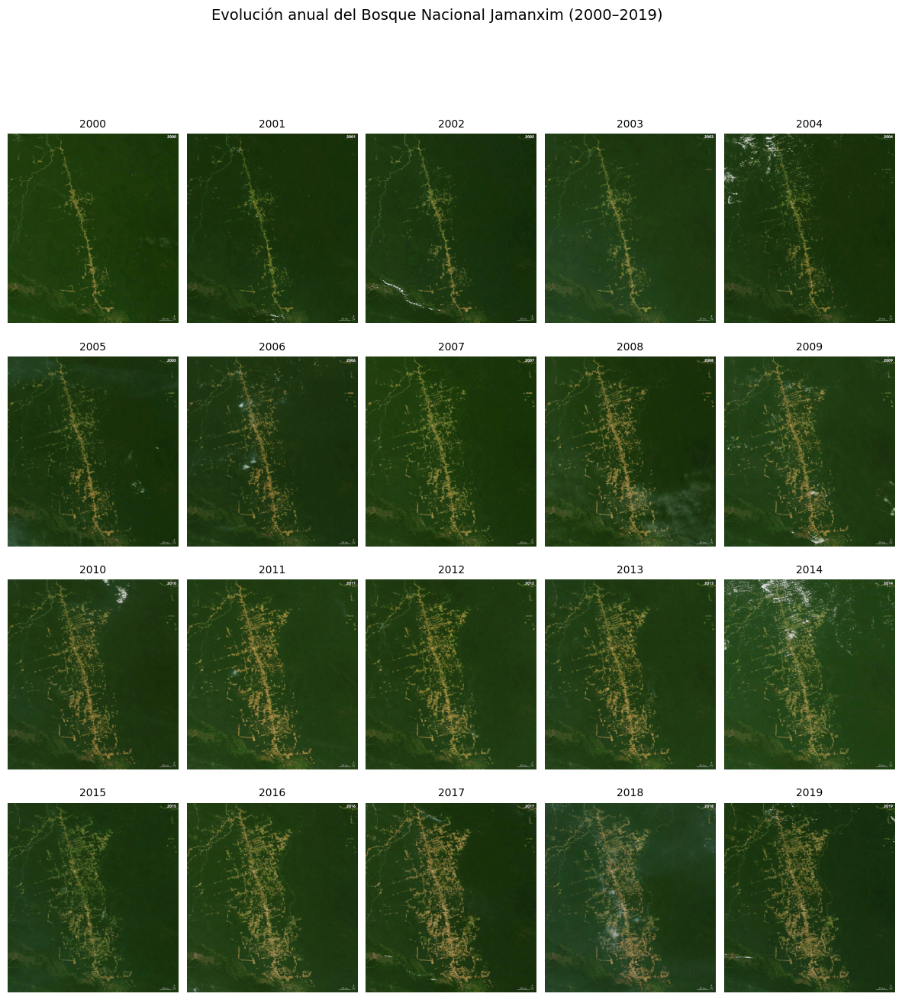

In [8]:
# Creamos una figura de 4 filas y 5 columnas para mostrar los 20 fotogramas extraídos
fig, axes = plt.subplots(4, 5, figsize=(15, 15))

# Eliminamos márgenes innecesarios entre subplots
plt.subplots_adjust(wspace=0.05, hspace=0.05)

# Iteramos sobre cada fotograma y lo colocamos en su posición correspondiente
for idx, (year, img) in enumerate(frames_dict.items()):
    row = idx // 5  # Índice de fila
    col = idx % 5   # Índice de columna
    
    # Mostramos la imagen en el subplot correspondiente
    axes[row, col].imshow(img)
    axes[row, col].set_title(str(year), fontsize=10)
    axes[row, col].axis("off")

# Mostramos la figura completa con todos los fotogramas
plt.suptitle("Evolución anual del Bosque Nacional Jamanxim (2000–2019)", fontsize=14)
plt.show()

Este bloque verifica las dimensiones de cada imagen antes de realizar transformaciones. Se comprueba que todas tienen la misma resolución, lo cual justifica que no sea necesario aplicar redimensionado. Al mantener el tamaño original se evita una posible distorsión o pérdida de información, y se garantiza una comparación justa entre procesamientos aplicados a distintas imágenes.

### 4.2 Conversión a escala de grises

In [9]:
# Creamos un diccionario para almacenar las versiones en escala de grises
gray_frames_dict = {}

# Recorremos cada imagen original en color
for year, img_rgb in frames_dict.items():
    # Convertimos de RGB a escala de grises y normalizamos a [0, 1]
    gray_img = img_as_float(rgb2gray(img_rgb))
    
    # Guardamos la imagen resultante en el nuevo diccionario
    gray_frames_dict[year] = gray_img

Este bloque convierte las imágenes de color al espacio de grises utilizando la función `rgb2gray()` de `skimage.color`. Esta función calcula una media ponderada de los canales R, G y B para reflejar la percepción luminosa del ojo humano. Además, devuelve directamente una imagen tipo *float64* con valores de intensidad normalizados entre $0$ y $1$, lo que permite aplicar directamente transformaciones posteriores sin necesidad de escalar manualmente los datos.

### 4.3 Conversión al espacio de color HSV

In [10]:
# Diccionario para imágenes en el espacio HSV
hsv_frames_dict = {}

# Recorremos cada imagen original en color
for year, img_rgb in frames_dict.items():
    # Convertimos la imagen del espacio RGB al espacio HSV
    hsv_img = rgb2hsv(img_rgb)
    
    # Guardamos la imagen convertida en el nuevo diccionario
    hsv_frames_dict[year] = hsv_img

Este bloque aplica un proceso de binarización adaptado a cada imagen utilizando el método de Otsu, implementado en `skimage.filters.threshold_otsu`. Este algoritmo determina automáticamente el umbral que maximiza la varianza entre clases (fondo y objeto), generando una segmentación binaria sin intervención manual.

A partir de este umbral, las imágenes en escala de grises se convierten en binarias, donde los píxeles con intensidad superior al umbral se etiquetan como 1 (blanco) y el resto como 0 (negro). Este formato es necesario para aplicar correctamente las operaciones morfológicas clásicas, que requieren una representación binaria para definir las regiones sobre las que actúan los elementos estructurales.

### 4.4 Conversión al espacio de color Lab

In [11]:
# Diccionario para imágenes en el espacio Lab
lab_frames_dict = {}

# Recorremos cada imagen original en color
for year, img_rgb in frames_dict.items():
    # Convertimos la imagen al espacio Lab
    lab_img = rgb2lab(img_rgb)
    
    # Guardamos la imagen convertida en el nuevo diccionario
    lab_frames_dict[year] = lab_img

### 4.5 Visualización de una imágen original y sus conversiones

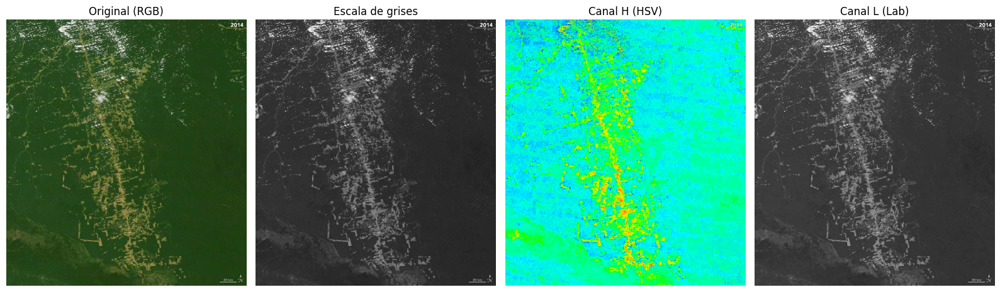

In [12]:
# Año de referencia para la visualización
year_ref = 2014

# Extraemos las imágenes correspondientes al año 2000
original_img = frames_dict[year_ref]
gray_img = gray_frames_dict[year_ref]
hsv_img = hsv_frames_dict[year_ref]
lab_img = lab_frames_dict[year_ref]

# Creamos una figura con 1 fila y 4 columnas
fig, axs = plt.subplots(1, 4, figsize=(16, 5))

# Imagen original en color
axs[0].imshow(original_img)
axs[0].set_title("Original (RGB)")
axs[0].axis("off")

# Imagen en escala de grises
axs[1].imshow(gray_img, cmap='gray')
axs[1].set_title("Escala de grises")
axs[1].axis("off")

# Visualización del canal de tono (H) de HSV
axs[2].imshow(hsv_img[:, :, 0], cmap='hsv')
axs[2].set_title("Canal H (HSV)")
axs[2].axis("off")

# Visualización del canal L de Lab
axs[3].imshow(lab_img[:, :, 0], cmap='gray')
axs[3].set_title("Canal L (Lab)")
axs[3].axis("off")

# Ajustamos el diseño de la figura
plt.tight_layout()
plt.show()

Los resultados de las transformaciones aplicadas sobre las imágenes satelitales han permitido observar diferencias notables entre los distintos espacios de color. Para esta evaluación se ha seleccionado intencionadamente un fotograma correspondiente al año 2014, que presenta una alta presencia de nubes en la parte superior, además de contener marcas visuales asociadas a la escala gráfica, el año y zonas deforestadas de diferente antigüedad y extensión. Este análisis ha sido clave para determinar cuál de las representaciones disponibles proporciona una segmentación más robusta y menos sensible a artefactos visuales o condiciones atmosféricas.

Tras comparar visualmente las imágenes transformadas a escala de grises, HSV (canal H) y Lab (canal L), se ha decidido trabajar exclusivamente con el canal L del espacio de color *CIELab*. Esta elección responde a criterios técnicos sólidos. En primer lugar, el canal L representa la componente de luminancia, es decir, la intensidad de brillo de cada píxel, independientemente del color. Esto permite detectar de manera consistente las zonas deforestadas, que tienden a presentar una luminancia mayor que la vegetación densa, al tiempo que se facilita la identificación de nubes, que se manifiestan con valores muy altos en este canal. Esta propiedad es esencial para aplicar estrategias automáticas de exclusión de nubes y marcas de agua que, al estar sobreimpresas en blanco, podrían interferir con el proceso de segmentación.

En segundo lugar, el canal H del espacio HSV, aunque útil para diferenciar matices de color, resulta inestable ante cambios de iluminación y compresión, y produce artefactos cromáticos difíciles de controlar en un análisis multitemporal. Además, las diferencias entre años provocadas por variaciones atmosféricas o de exposición afectan negativamente a la consistencia del canal H, lo que compromete la reproducibilidad del pipeline.

Por tanto, optar por el canal L no solo permitirá separar eficazmente las zonas deforestadas por su luminancia, sino que también facilitará la implementación de umbrales adaptativos y operaciones morfológicas sobre una imagen monocanal. Esto simplificará la detección, reducirá el riesgo de errores y garantizará una mayor coherencia a lo largo de toda la serie temporal. La elección del canal L como base para el análisis se fundamenta, por tanto, en su mayor robustez, claridad estructural, y compatibilidad con técnicas clásicas de segmentación y postprocesado.

### 4.6 Análisis visual y funcional de los canales Lab

El espacio de color *CIELAB* permite descomponer una imagen en tres componentes perceptuales: **L** (luminosidad), **a** (verde–rojo) y **b** (azul–amarillo), facilitando la separación de información estructural y cromática. Para evaluar su utilidad en nuestro flujo de trabajo, se representa una imagen de referencia junto a sus tres canales individuales, permitiendo observar visualmente las características que cada uno enfatiza.

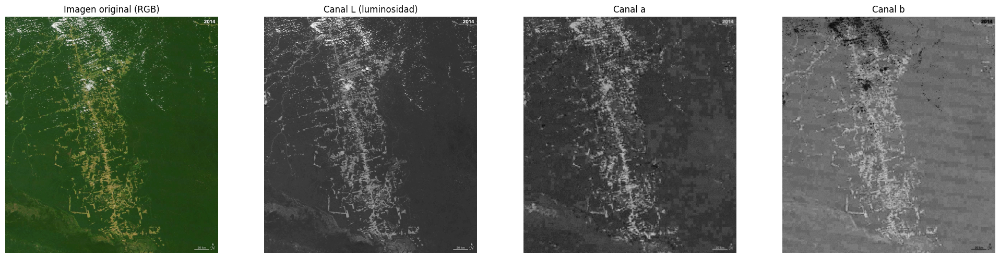

In [13]:
# Año de referencia que deseamos visualizar
year_ref = 2014

# Extraemos la imagen en color original y su versión en espacio Lab
original_img = frames_dict[year_ref]
lab_img = lab_frames_dict[year_ref]

# Separamos los canales L, a y b del espacio Lab
L_channel = lab_img[:, :, 0]
a_channel = lab_img[:, :, 1]
b_channel = lab_img[:, :, 2]

# Mostramos la imagen original y los tres canales Lab en escala de grises
fig, axs = plt.subplots(1, 4, figsize=(20, 5))

# Imagen original en color RGB
axs[0].imshow(original_img)
axs[0].set_title("Imagen original (RGB)")
axs[0].axis("off")

# Canal L (luminosidad)
axs[1].imshow(L_channel, cmap='gray')
axs[1].set_title("Canal L (luminosidad)")
axs[1].axis("off")

# Canal a (verde ↔ magenta)
axs[2].imshow(a_channel, cmap='gray')
axs[2].set_title("Canal a")
axs[2].axis("off")

# Canal b (azul ↔ amarillo)
axs[3].imshow(b_channel, cmap='gray')
axs[3].set_title("Canal b")
axs[3].axis("off")

# Ajustamos el diseño de la figura
plt.tight_layout()
plt.show()


La inspección del canal **L** revela una notable capacidad para **resaltar las zonas deforestadas**, que se presentan con valores de luminancia más altos respecto al bosque circundante. Esta diferenciación clara entre áreas degradadas y vegetadas convierte al canal *L* en el **candidato idóneo para la segmentación principal** a lo largo del estudio, ya que maximiza el contraste estructural sin verse afectado por componentes cromáticas irrelevantes.

El canal **a** presenta cierto detalle estructural en las zonas deforestadas, aunque con menor contraste que el canal *L*. No se observan ventajas significativas para su uso en la tarea de segmentación, por lo que es descartado en las fases iniciales del *pipeline*.

Por el contrario, el canal **b** muestra una capacidad inesperadamente útil: **las nubes, marcas gráficas (como el texto del año o la escala de referencia) y otras regiones sobresaturadas en blanco aparecen como áreas muy oscuras**. Este comportamiento puede aprovecharse para diseñar una **máscara auxiliar de exclusión**, destinada a filtrar regiones no válidas (por ejemplo, nubes o anotaciones) durante el posprocesamiento de la segmentación. Este uso preventivo del canal *b* aumentará la precisión del análisis al reducir falsos positivos.

## 5. Evaluación y diseño del *pipeline* de mejora previa

En esta sección se desarrolla la fase de preprocesamiento orientada a normalizar la luminancia y mejorar el contraste tonal de las imágenes antes de aplicar cualquier técnica de segmentación. Partiendo de la conversión al espacio de color Lab, previamente seleccionado por su capacidad para separar la componente de luminancia (canal L) de la información cromática (canales A y B), se implementa un *pipeline* estructurado que combina técnicas complementarias: ecualización local mediante CLAHE para mejorar el contraste adaptativo, realce de detalles oscuros con filtro *Top-Hat*, y mejora de bordes mediante *Unsharp Masking*. Este proceso busca reforzar la visibilidad de patrones relevantes, homogeneizar la respuesta tonal entre imágenes de distintos años y preparar un canal L robusto sobre el que aplicar, en secciones posteriores, los procedimientos de segmentación multitemporal.

### 5.1 Estudio del canal L del espacio Lab

#### 5.1.1 Visualización y análisis de histogramas iniciales

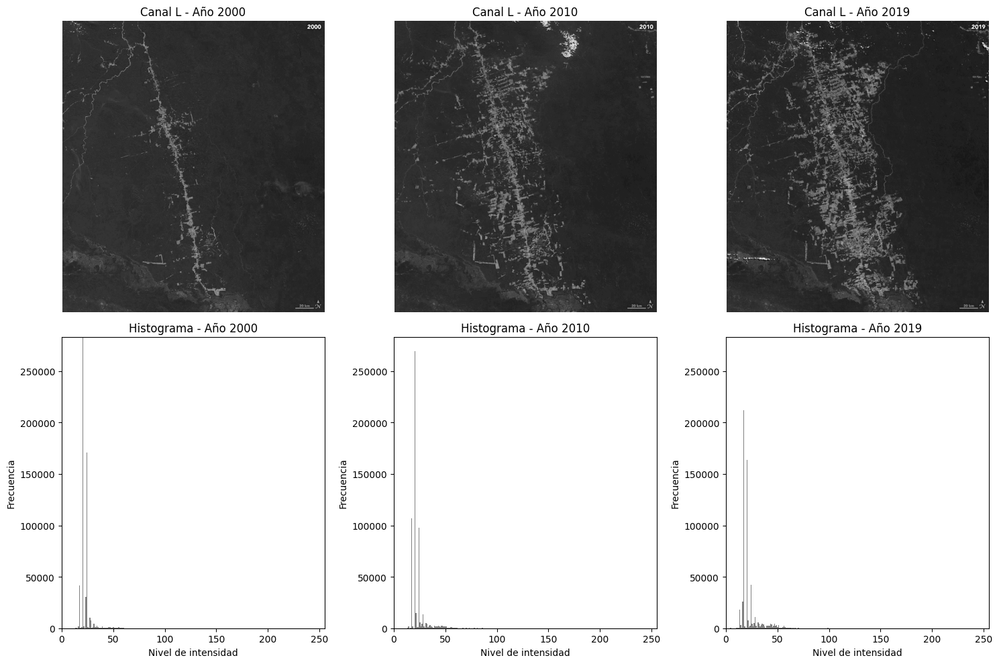

In [14]:
# Años seleccionados para el análisis
selected_years = [2000, 2010, 2019]

# Calculamos la frecuencia máxima global para normalizar la escala vertical
max_freq = 0
for year in selected_years:
    img_lab = lab_frames_dict[year][:, :, 0]
    hist, _ = np.histogram(img_lab.ravel(), bins=256, range=(0, 255))
    max_freq = max(max_freq, hist.max())

# Creamos figura con una fila por año y dos columnas: imagen + histograma
fig, axes = plt.subplots(2, len(selected_years), figsize=(15, 10))

for idx, year in enumerate(selected_years):
    img_lab = lab_frames_dict[year][:, :, 0]

    # Imagen canal L
    axes[0, idx].imshow(img_lab, cmap='gray')
    axes[0, idx].set_title(f"Canal L - Año {year}")
    axes[0, idx].axis("off")

    # Histograma con escala uniforme
    axes[1, idx].hist(img_lab.ravel(), bins=256, range=(0, 255), color='gray')
    axes[1, idx].set_title(f"Histograma - Año {year}")
    axes[1, idx].set_xlim(0, 255)
    axes[1, idx].set_ylim(0, max_freq)
    axes[1, idx].set_xlabel("Nivel de intensidad")
    axes[1, idx].set_ylabel("Frecuencia")

plt.tight_layout()
plt.show()

La inspección conjunta de las imágenes en el canal L y sus respectivos histogramas revela una distribución altamente concentrada en los niveles bajos de intensidad, con escasa representación en los rangos medios y altos. Esta acumulación indica que la mayoría de píxeles corresponden a zonas oscuras, asociadas a la densa cobertura arbórea. Por su parte, las regiones deforestadas y las formaciones nubosas se sitúan en valores de luminancia más elevados, especialmente visibles en torno al nivel 80 en los histogramas, aunque su frecuencia relativa es notablemente menor. Esta compresión del rango dinámico limita la capacidad del sistema para distinguir estructuras relevantes, reduciendo el contraste entre clases de interés y dificultando una segmentación eficaz.

Ante esta situación, se considera necesario aplicar una transformación de normalización del histograma que permita redistribuir los valores de intensidad, incrementando la separación entre clases y mejorando la visibilidad de los detalles estructurales.

### 5.2 Mejora del contraste mediante normalización del histograma

#### 5.2.1 Aplicación de *stretching* lineal

In [15]:
# Creamos un nuevo diccionario para guardar las imágenes normalizadas del canal L
lab_norm_dict = {}

# Recorremos cada año del diccionario original
for year, img in lab_frames_dict.items():
    # Aplicamos normalización lineal del histograma al rango [0, 255]
    img_norm = cv2.normalize(img, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
    
    # Aseguramos el tipo uint8 para visualización y procesamiento posterior
    lab_norm_dict[year] = img_norm.astype(np.uint8)

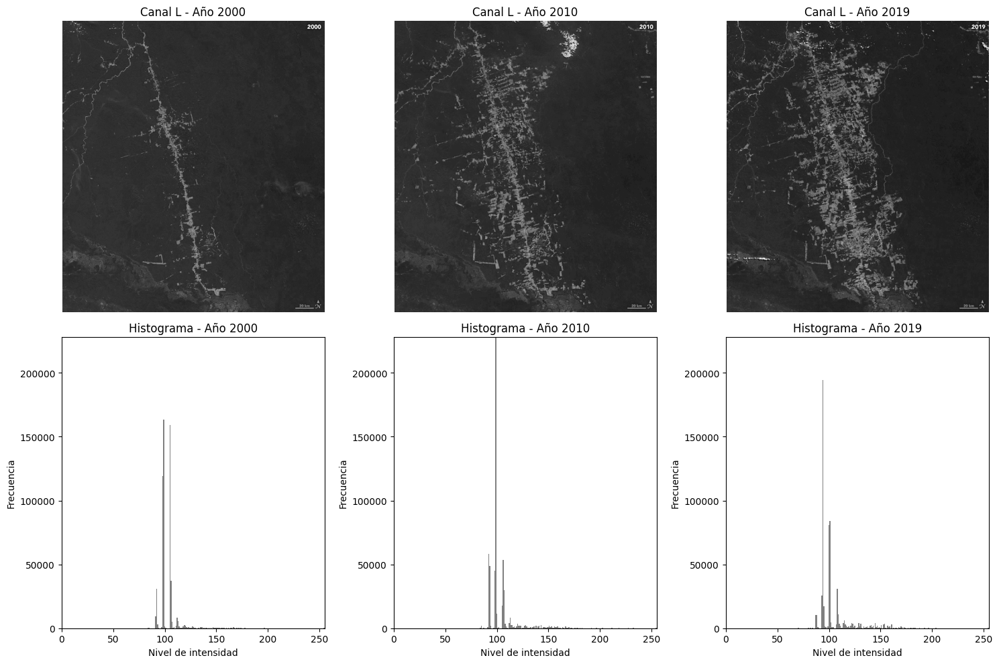

In [16]:
# Años seleccionados para el análisis
selected_years = [2000, 2010, 2019]    

# Calculamos la frecuencia máxima global para normalizar la escala vertical
max_freq = 0
for year in selected_years:
    img_lab = lab_norm_dict[year][:, :, 0]
    hist, _ = np.histogram(img_lab.ravel(), bins=256, range=(0, 255))
    max_freq = max(max_freq, hist.max())

# Creamos figura con una fila por año y dos columnas: imagen + histograma
fig, axes = plt.subplots(2, len(selected_years), figsize=(15, 10))

for idx, year in enumerate(selected_years):
    img_lab = lab_norm_dict[year][:, :, 0]

    # Imagen canal L
    axes[0, idx].imshow(img_lab, cmap='gray')
    axes[0, idx].set_title(f"Canal L - Año {year}")
    axes[0, idx].axis("off")

    # Histograma con escala uniforme
    axes[1, idx].hist(img_lab.ravel(), bins=256, range=(0, 255), color='gray')
    axes[1, idx].set_title(f"Histograma - Año {year}")
    axes[1, idx].set_xlim(0, 255)
    axes[1, idx].set_ylim(0, max_freq)
    axes[1, idx].set_xlabel("Nivel de intensidad")
    axes[1, idx].set_ylabel("Frecuencia")

plt.tight_layout()
plt.show()

Los resultados obtenidos tras la normalización del histograma del canal **L** permiten extraer varias conclusiones relevantes desde un punto de vista técnico y metodológico.

En primer lugar, la inspección visual de las imágenes normalizadas muestra una **mejora clara en el contraste global**, especialmente en las zonas asociadas a superficies deforestadas. Estas áreas presentan ahora una separación más nítida respecto a las regiones no alteradas. Este efecto es especialmente evidente en los años más recientes, donde la densidad de estructuras antrópicas es mayor y la normalización facilita su identificación visual sin introducir artefactos artificiales.

Desde el punto de vista estadístico, los histogramas resultantes evidencian una **redistribución más homogénea de los niveles de intensidad** a lo largo del rango dinámico disponible. Mientras que en las imágenes originales la mayor parte de los valores se concentraba en un intervalo estrecho de bajas intensidades, tras la normalización se observa una expansión del histograma que incrementa la separabilidad entre clases implícitas presentes en la imagen. Esta redistribución no altera la estructura espacial de la señal, sino que amplifica diferencias ya existentes, lo que resulta coherente con el objetivo de preparar la imagen para etapas posteriores de segmentación.

#### 5.2.2. Aplicación de CLAHE (ecualización adaptativa)

In [17]:
# Definimos un nuevo diccionario para almacenar los resultados tras aplicar CLAHE al canal L
clahe_lab_dict = {}

# Creamos el objeto CLAHE con parámetros personalizados
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

# Aplicamos CLAHE a cada imagen normalizada del canal L
for year, img_lab in lab_norm_dict.items():
    # Extraemos el canal L (primer canal de la imagen Lab)
    channel_l = img_lab[:, :, 0]

    # Aplicamos CLAHE al canal L (requiere tipo uint8)
    clahe_l = clahe.apply(channel_l)

    # Sustituimos el canal L original por el modificado y conservamos A y B
    img_clahe_lab = img_lab.copy()
    img_clahe_lab[:, :, 0] = clahe_l

    # Guardamos la nueva imagen Lab con el canal L mejorado
    clahe_lab_dict[year] = img_clahe_lab

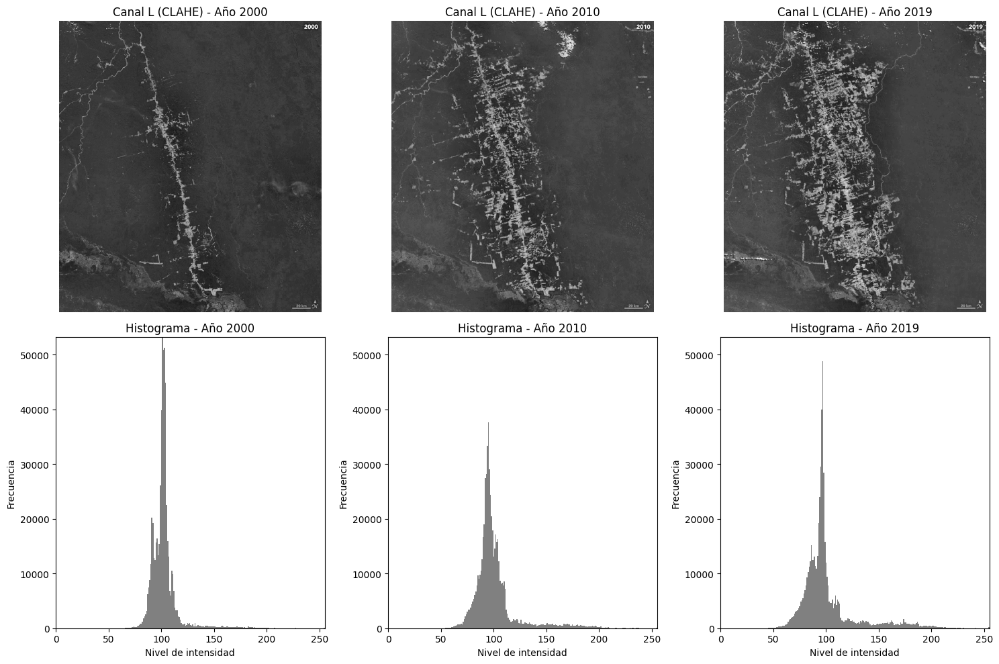

In [18]:
# Años seleccionados para el análisis
selected_years = [2000, 2010, 2019]

# Calculamos la frecuencia máxima para normalizar los histogramas
max_freq = 0
for year in selected_years:
    l_channel = clahe_lab_dict[year][:, :, 0]
    hist, _ = np.histogram(l_channel.ravel(), bins=256, range=(0, 255))
    max_freq = max(max_freq, hist.max())

# Creamos la figura: una fila por año, dos columnas: imagen y histograma
fig, axes = plt.subplots(2, len(selected_years), figsize=(15, 10))

for idx, year in enumerate(selected_years):
    l_channel = clahe_lab_dict[year][:, :, 0]

    # Mostramos la imagen del canal L tras CLAHE
    axes[0, idx].imshow(l_channel, cmap='gray')
    axes[0, idx].set_title(f"Canal L (CLAHE) - Año {year}")
    axes[0, idx].axis("off")

    # Mostramos el histograma correspondiente
    axes[1, idx].hist(l_channel.ravel(), bins=256, range=(0, 255), color='gray')
    axes[1, idx].set_title(f"Histograma - Año {year}")
    axes[1, idx].set_xlim(0, 255)
    axes[1, idx].set_ylim(0, max_freq)
    axes[1, idx].set_xlabel("Nivel de intensidad")
    axes[1, idx].set_ylabel("Frecuencia")

plt.tight_layout()
plt.show()

La aplicación de *Contrast Limited Adaptive Histogram Equalization (CLAHE)* sobre el canal L produce una redistribución más equilibrada de los niveles de intensidad, especialmente en regiones previamente concentradas en rangos bajos y medios. A diferencia de la normalización lineal, que actúa de forma global sobre el rango dinámico, CLAHE introduce una mejora localizada del contraste, permitiendo realzar estructuras internas sin saturar de manera uniforme toda la imagen.

Desde el punto de vista visual, se observa una mayor definición de las áreas asociadas a procesos de deforestación, particularmente en zonas donde el contraste con la vegetación circundante era reducido tras el *stretching* lineal. Las tramas lineales y fragmentadas, características de la expansión antrópica, aparecen más continuas y mejor delimitadas, lo que favorece su posterior identificación mediante técnicas de segmentación por umbral.

El análisis de los histogramas confirma este comportamiento. Tras aplicar CLAHE, la distribución de intensidades se ensancha de forma controlada, reduciendo la acumulación excesiva en intervalos estrechos y aumentando la separabilidad entre clases radiométricas. Aunque las zonas de alta luminosidad, asociadas principalmente a nubes y artefactos, también se ven realzadas, estas permanecen concentradas en el extremo superior del rango dinámico, lo que permitirá su exclusión posterior sin interferir de forma significativa en la detección de áreas deforestadas.

#### 5.2.3. Comparativa de resultados y decisión sobre la técnica seleccionada

Tras comparar visual y estadísticamente los efectos de la **normalización lineal del histograma (*stretching*)** y de la ecualización adaptativa mediante **CLAHE**, se opta por integrar **CLAHE como técnica de mejora de contraste definitiva** dentro del *pipeline* de procesamiento.

La normalización lineal permite una expansión global del rango dinámico y constituye una mejora inicial respecto a la imagen original. Sin embargo, su carácter global limita la realce de estructuras locales, especialmente en regiones donde la deforestación presenta patrones fragmentados o contrastes débiles frente al fondo forestal.

Por el contrario, CLAHE ofrece una mejora localizada del contraste que favorece la separación entre áreas deforestadas y vegetadas, incluso en condiciones de iluminación no homogéneas. Aunque este método incrementa la luminosidad de regiones extremas como las nubes, dichas zonas permanecen claramente diferenciadas en el extremo alto de la escala de intensidades, lo que permite su tratamiento posterior sin introducir ambigüedad significativa en la segmentación.

### 5.2 Realce de estructuras claras mediante filtrado morfológico (*white top-hat*)

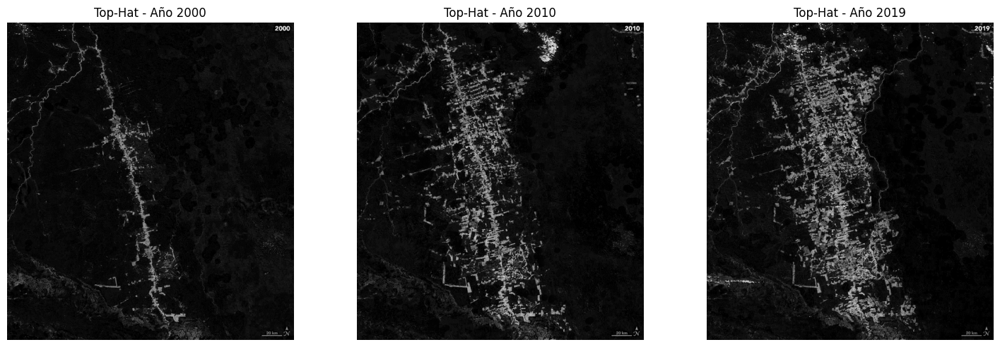

In [19]:
# Creamos el diccionario para guardar los resultados de Top-Hat
tophat_dict = {}

# Definimos el elemento estructural (disco de radio 15 px)
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (15, 15))

# Aplicamos Top-Hat al canal L de cada imagen normalizada
for year, img in clahe_lab_dict.items():
    canal_L = img[:, :, 0]  # Extraemos canal L
    tophat = cv2.morphologyEx(canal_L, cv2.MORPH_TOPHAT, kernel)
    tophat_dict[year] = tophat

# Años seleccionados para mostrar
selected_years = [2000, 2010, 2019]

# Visualizamos los resultados
fig, axs = plt.subplots(1, len(selected_years), figsize=(15, 5))

for idx, year in enumerate(selected_years):
    axs[idx].imshow(tophat_dict[year], cmap='gray')
    axs[idx].set_title(f"Top-Hat - Año {year}")
    axs[idx].axis('off')

plt.tight_layout()
plt.show()

Los resultados obtenidos tras aplicar el filtro *white top-hat* sobre las imágenes previamente mejoradas con CLAHE evidencian una mejora significativa en la visibilidad de los patrones de deforestación. Este operador morfológico ha permitido resaltar eficazmente las estructuras claras más pequeñas y brillantes del canal L, que corresponden a áreas recientemente deforestadas y fragmentadas dentro del bosque denso. La homogeneidad de la vegetación circundante actúa como fondo oscuro, lo que potencia aún más el contraste y facilita la identificación de formas angulosas características de la actividad humana, como parcelas rectangulares o trazados lineales de caminos.

En todos los años evaluados, el *top-hat* enfatiza de forma robusta tanto las áreas centrales de expansión como los focos periféricos incipientes, proporcionando una base sólida para las etapas posteriores de segmentación. La decisión de aplicarlo exclusivamente al canal L, ya mejorado con CLAHE, ha resultado adecuada desde el punto de vista técnico, ya que se preserva la estructura radiométrica sin introducir distorsiones cromáticas innecesarias. Además, el hecho de que el canal L refleje directamente la variación de luminosidad hace que este filtro morfológico opere de forma más precisa y controlada que si se aplicara sobre una imagen en escala de grises tradicional.

### 5.3 Mejora estructural mediante Unsharp Masking

In [20]:
# Diccionario para almacenar los resultados del realce de nitidez
sharpened_dict = {}

# Parámetros del Unsharp Masking
sigma = 1.0     # Desviación estándar del suavizado gaussiano
amount = 0.8    # Factor de realce (moderado para evitar saturación)

# Recorremos todas las imágenes procesadas con Top-Hat
for year, img in tophat_dict.items():
    # Normalizamos explícitamente la imagen al rango [0, 1]
    img_norm = (img - img.min()) / (img.max() - img.min())

    # Aplicamos un suavizado gaussiano para obtener la componente de baja frecuencia
    img_blur = cv2.GaussianBlur(img_norm, ksize=(0, 0), sigmaX=sigma)

    # Calculamos la máscara de detalle
    detail_mask = img_norm - img_blur

    # Aplicamos la máscara de nitidez
    img_sharp = img_norm + amount * detail_mask

    # Forzamos el rango válido [0, 1] para evitar saturaciones
    img_sharp = np.clip(img_sharp, 0, 1)

    # Guardamos el resultado en el diccionario
    sharpened_dict[year] = img_sharp

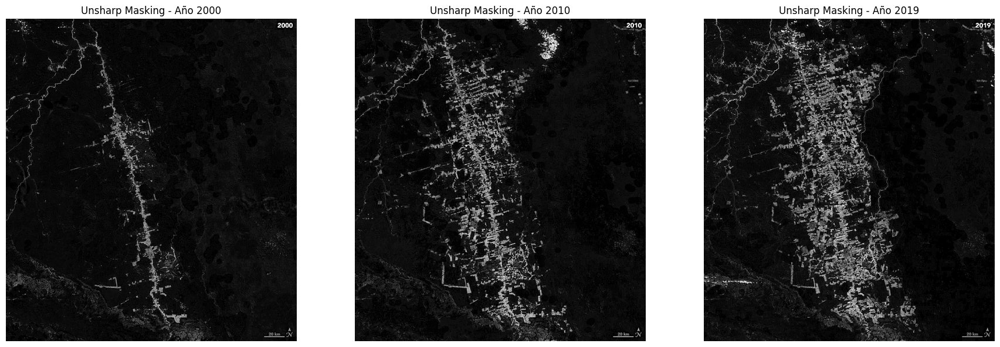

In [21]:
# Años seleccionados para mostrar
selected_years = [2000, 2010, 2019]

# Creamos figura con una fila por año (tres columnas)
fig, axes = plt.subplots(1, len(selected_years), figsize=(18, 6))

for idx, year in enumerate(selected_years):
    # Recuperamos imagen del diccionario
    img_sharp = sharpened_dict[year]

    # Mostramos la imagen resultante
    axes[idx].imshow(img_sharp, cmap='gray')
    axes[idx].set_title(f"Unsharp Masking - Año {year}")
    axes[idx].axis("off")

plt.tight_layout()
plt.show()

La aplicación de *Unsharp Masking* sobre las imágenes procesadas con CLAHE y filtro *Top-Hat* ha resultado eficaz para reforzar los bordes y realzar estructuras lineales sutiles asociadas a procesos de deforestación. En particular, se observa una mejora en la nitidez de los límites entre las áreas deforestadas y la vegetación circundante, así como un incremento del contraste local en regiones con variaciones tonales poco marcadas.

Este efecto es especialmente evidente en zonas periféricas a los caminos o polígonos de tala, donde anteriormente el contraste era insuficiente para una delimitación clara. Aunque el filtro tiende a aclarar ligeramente otras regiones, incluidas nubes residuales o etiquetas en las esquinas, su interacción con el canal *b* del espacio Lab, que previamente se ha analizado como discriminador eficaz de nubes y marcas artificiales, permitirá neutralizar estos efectos en etapas posteriores del *pipeline*.

### 5.4 Creación del *pipeline* final de mejora del contraste y los detalles estructurales

In [22]:
def enhance_luminance_pipeline(frames_dict, clip_limit=2.0, tile_grid_size=(8, 8), tophat_kernel_size=15, sigma=1.0, amount=0.8):
    """
    Pipeline completo de mejora del canal L en el espacio Lab.
    Aplica CLAHE, filtrado morfológico Top-Hat y Unsharp Masking, preservando los canales A y B.

    Parámetros:
        frames_dict (dict): Diccionario de imágenes RGB en float [0, 1].
        clip_limit (float): Límite de contraste para CLAHE.
        tile_grid_size (tuple): Tamaño del grid para CLAHE.
        tophat_kernel_size (int): Tamaño del kernel estructural para Top-Hat.
        sigma (float): Desviación estándar del suavizado gaussiano.
        amount (float): Intensidad de la máscara de nitidez.

    Devuelve:
        dict_final_lab (dict): Diccionario con imágenes Lab mejoradas (L modificado, A y B originales).
    """

    dict_final_lab = {}
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (tophat_kernel_size, tophat_kernel_size))
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)

    for year, img_rgb in frames_dict.items():
        # Conversión a Lab
        lab = rgb2lab(img_rgb)
        l_channel = lab[:, :, 0]

        # Normalización L a [0, 255] para aplicar CLAHE
        l_255 = cv2.normalize(l_channel, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
        l_clahe = clahe.apply(l_255)

        # Top-Hat sobre resultado de CLAHE
        l_tophat = cv2.morphologyEx(l_clahe, cv2.MORPH_TOPHAT, kernel)

        # Unsharp Masking (con normalización explícita)
        # Normalizamos explícitamente la imagen al rango [0, 1]
        l_float = (l_tophat - l_tophat.min()) / (l_tophat.max() - l_tophat.min())

        # Aplicamos un suavizado gaussiano para obtener la componente de baja frecuencia
        l_blur = cv2.GaussianBlur(l_float, (0, 0), sigmaX=sigma)

        # Calculamos la máscara de detalle
        l_detail = l_float - l_blur

        # Aplicamos la máscara de nitidez y forzamos el rango válido [0, 1] para evitar saturaciones
        l_sharp = np.clip(l_float + amount * l_detail, 0, 1)

        # Reescalado a [0, 100] como exige el canal L de Lab
        l_final = l_sharp * 100.0

        # Reconstrucción de imagen Lab final
        lab[:, :, 0] = l_final  # Solo sustituimos el canal L
        dict_final_lab[year] = lab

    return dict_final_lab


## 6. Evaluación de algoritmos clásicos de segmentación en imágenes satelitales

A lo largo de este apartado se analizan distintos enfoques clásicos de segmentación aplicados a imágenes satelitales del Bosque Nacional Jamanxim, con el objetivo de identificar el método más robusto y reproducible para delimitar zonas deforestadas en un contexto multitemporal. Se parte de un preprocesamiento basado en binarización, evaluando variantes del umbral de Otsu y métodos basados en el espacio HSV, para después aplicar técnicas de segmentación más avanzadas que incluyen crecimiento de regiones, partición jerárquica (*Split & Merge*), contornos activos, cuenca hidrográfica (*Watershed*) y enfoques basados en grafos como *Graph-Cuts* y agregación multiescala. Cada técnica se evalúa de forma comparativa en términos de precisión visual, comportamiento sobre regiones degradadas y sensibilidad a condiciones variables de iluminación y cobertura. Esta fase constituye la base para la posterior selección e implementación del método óptimo de segmentación sobre el conjunto completo de imágenes.

### 6.1 Preprocesamiento por binarización de imágenes realzadas

En esta sección se comparan tres métodos de binarización sobre las imágenes del canal L realzado, con el fin de identificar el enfoque más adecuado para segmentar áreas de deforestación de forma automatizada. Las imágenes se procesan sin aplicar aún crecimiento por semillas u operaciones morfológicas complejas.

#### 6.1.1 Binarización mediante umbral de Otsu

In [23]:
# Diccionario para almacenar las máscaras binarias
binarized_otsu_dict = {}

# Aplicamos Otsu a cada imagen del canal L realzado
for year, img in sharpened_dict.items():
    thresh = threshold_otsu(img)
    binary = (img >= thresh).astype(np.uint8)
    binarized_otsu_dict[year] = binary

#### 6.1.2 Binarización por Otsu con ajuste de umbral

In [24]:
# Diccionario para almacenar los resultados
binarized_otsu_offset_dict = {}

# Definimos un pequeño desplazamiento para endurecer el umbral de Otsu
offset = 0.1  # Ajustable: positivo endurece, negativo suaviza

for year, img in sharpened_dict.items():
    thresh = threshold_otsu(img)
    adjusted_thresh = thresh + offset
    binary = (img >= adjusted_thresh).astype(np.uint8)
    binarized_otsu_offset_dict[year] = binary

#### 6.1.3 Binarización basada en rango de color HSV

In [25]:
# Diccionario para almacenar máscaras binarias HSV
binarized_hsv_dict = {}

for year, img_rgb in frames_dict.items():
    # Convertimos a uint8 si está en float
    img_uint8 = (img_rgb * 255).astype(np.uint8)

    # Convertimos a HSV
    img_hsv = cv2.cvtColor(img_uint8, cv2.COLOR_RGB2HSV)

    # Definimos el rango de color asociado a deforestación (ajustable)
    lower_deforest = np.array([30, 70, 10])
    upper_deforest = np.array([130, 255, 255])

    # Creamos la máscara binaria
    mask = cv2.inRange(img_hsv, lower_deforest, upper_deforest)
    binarized_hsv_dict[year] = mask // 255  # Escalamos a 0–1 para coherencia

#### 6.1.4 Visualización de los resultados

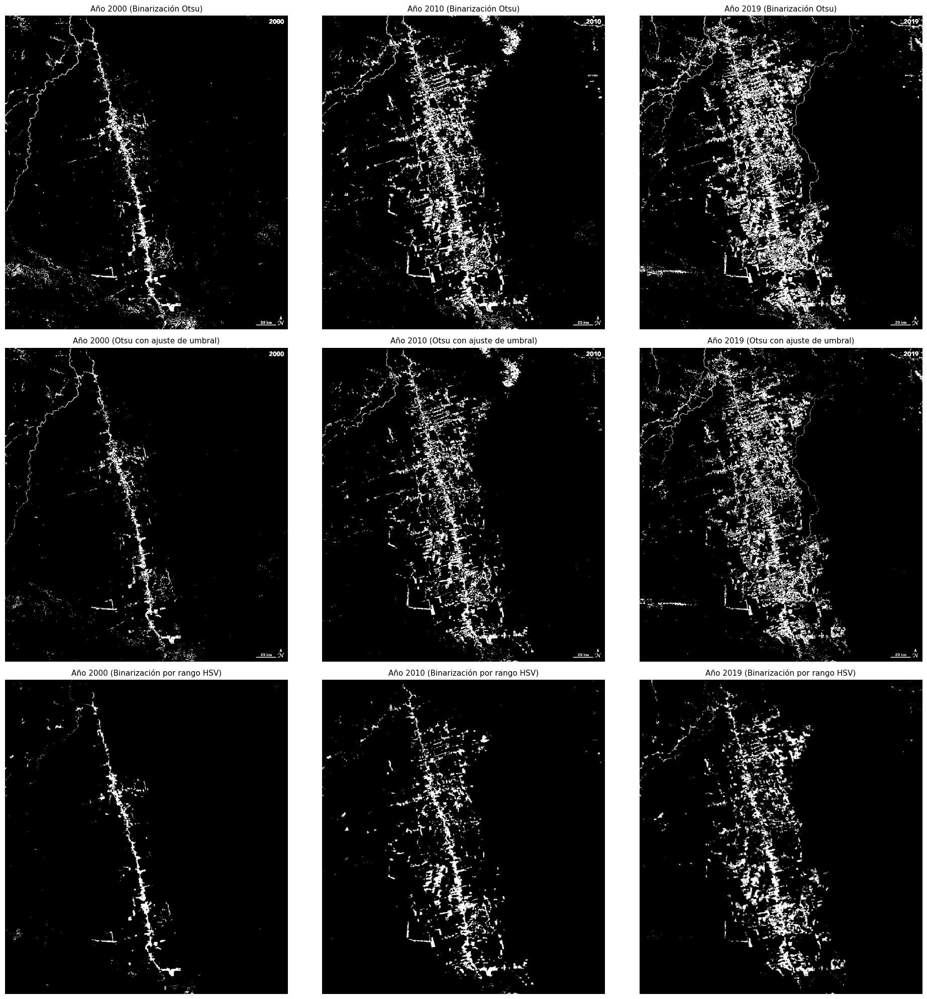

In [26]:
# Títulos de los métodos
titles = [
    "Binarización Otsu",
    "Otsu con ajuste de umbral",
    "Binarización por rango HSV"
]

# Diccionarios de resultados binarios
binary_dicts = [
    binarized_otsu_dict,
    binarized_otsu_offset_dict,
    binarized_hsv_dict
]

# Años seleccionados
selected_years = [2000, 2010, 2019]

# Creamos la figura
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(20, 20))
plt.subplots_adjust(hspace=0.4)

for row_idx, (method_title, binary_dict) in enumerate(zip(titles, binary_dicts)):
    for col_idx, year in enumerate(selected_years):
        ax = axes[row_idx, col_idx]
        ax.imshow(binary_dict[year], cmap='gray')
        ax.axis('off')
        ax.set_title(f"Año {year} ({method_title})", fontsize=11)

plt.tight_layout()
plt.show()

Tras aplicar tres enfoques distintos de binarización sobre las imágenes realzadas correspondientes a los años 2000, 2010 y 2019, se obtienen los resultados visuales que se muestran en la figura, donde pueden apreciarse las diferencias en la detección de zonas potencialmente deforestadas según el método empleado.

En primer lugar, la binarización automática mediante el método de Otsu ofrece una segmentación razonablemente eficaz en los años 2010 y 2019, donde las diferencias de luminancia entre zonas deforestadas y vegetación densa son más pronunciadas. No obstante, en 2000 el método subsegmenta ciertas regiones, probablemente debido al bajo contraste global de la imagen. A pesar de su sencillez, este método resulta insuficiente en contextos donde la iluminación o el contraste son limitados.

Para compensar esta limitación, se ha aplicado un segundo enfoque basado en Otsu con ajuste de umbral, añadiendo un *offset* positivo al umbral calculado. Esta variante mejora significativamente la segmentación en la imagen de 2000, recuperando áreas que antes quedaban infrarepresentadas. En los años posteriores mantiene una delimitación nítida de las zonas deforestadas, con buena continuidad espacial y escaso ruido. Esta configuración se revela más robusta frente a cambios de iluminación o presencia de nubes, y permite adaptar el proceso a la estructura tonal particular de cada año.

Finalmente, se ha evaluado un tercer enfoque mediante binarización por rango de color en el espacio HSV, orientado a capturar tonalidades asociadas a suelos descubiertos o zonas taladas (marrones claros). Este método presenta alta variabilidad entre años. En 2010 y 2019 detecta patrones relevantes, pero en 2000 se observan falsos positivos y fragmentación de regiones. La sensibilidad del método depende en gran medida de la calibración del rango cromático y de las condiciones atmosféricas presentes en cada imagen.

Por tanto, se concluye que **el método de Otsu con ajuste de umbral ofrece el mejor compromiso global**, al combinar un umbral adaptativo con un margen de ajuste que permite compensar déficits de contraste sin introducir ruido significativo. Esta técnica preserva con fidelidad la geometría de las áreas deforestadas y mantiene una coherencia temporal adecuada para el análisis comparativo de la pérdida de cobertura forestal.

#### 6.1.5 Implementación de la función de binarización seleccionada

Se definine de esta función para permitir aplicar de forma sistemática el método de binarización seleccionado sobre conjuntos completos de imágenes, manteniendo un control explícito sobre el parámetro de desplazamiento del umbral. De este modo, se evita la duplicación de código, se asegura la consistencia de los resultados y se facilita la integración del método en futuras llamadas, tanto para el procesamiento multitemporal como para la evaluación comparativa de escenarios alternativos.

In [27]:
def apply_otsu_with_offset(image_dict, offset=0.1):

    bin_dict = {}
    for year, img in image_dict.items():
        thresh = threshold_otsu(img)
        adjusted_thresh = thresh + offset
        binary = (img >= adjusted_thresh).astype(np.uint8)
        bin_dict[year] = binary
    return bin_dict

### 6.2 Segmentación por crecimiento de regiones basado en semillas

El **crecimiento de regiones basado en semillas** es uno de los métodos más intuitivos y directos dentro de esta familia de técnicas. El proceso comienza con la identificación de uno o varios **píxeles iniciales**, denominados semillas, que pueden seleccionarse de forma manual o automática a partir de criterios geométricos o de intensidad. Estas semillas representan el punto de partida de cada región que se desea segmentar.

A partir de cada semilla, el algoritmo analiza los píxeles vecinos y decide si deben incorporarse a la región en función de una medida de similitud, que suele basarse en la diferencia de intensidad, color o textura. Este proceso se repite de manera iterativa, de forma que la región va creciendo progresivamente hasta que no se encuentran más píxeles vecinos que cumplan el criterio establecido. El resultado final depende de manera directa tanto de la posición inicial de las semillas como de los umbrales de similitud utilizados.

El **crecimiento de regiones basado en semillas** es un método de segmentación sencillo e intuitivo que se desarrolla en **dos etapas principales**:

1. Se **identifican uno o varios píxeles iniciales**, denominados *semillas*. Estas semillas pueden seleccionarse de forma manual o automática, normalmente en función de **parámetros geométricos o de intensidad**, y representan el punto de partida de cada región que se desea segmentar.
2. **A partir de cada semilla se analiza la similitud de los píxeles vecinos**. El algoritmo evalúa si los píxeles adyacentes son suficientemente parecidos a la semilla o a la región en crecimiento, atendiendo a criterios como la intensidad, el color o la textura. Cuando un píxel vecino cumple el criterio de similitud, se incorpora a la región, que va creciendo de forma progresiva. Este proceso se repite de manera iterativa hasta que no se encuentran más píxeles vecinos que puedan añadirse. El resultado final depende directamente de la **posición inicial de las semillas** y del **criterio de similitud utilizado**.

Este método resulta especialmente útil para obtener **segmentaciones preliminares en imágenes de alto contraste**, donde las regiones de interés presentan una clara diferenciación respecto al fondo. Sin embargo, su carácter iterativo implica un <strong style="color:red">coste computacional elevado</strong>, y existe un riesgo significativo de <strong style="color:red">sobresegmentación</strong>, ya que regiones adyacentes con pequeñas variaciones pueden dividirse en exceso cuando deberían permanecer unidas.

In [28]:
# Diccionario para almacenar los resultados
segm_seed_dict = {}

# Recorremos las imágenes binarizadas
for year, binary_img in binarized_otsu_offset_dict.items():
    # Identificamos píxeles blancos como candidatos a semillas
    seed_candidates = np.argwhere(binary_img == 1)

    # Usamos directamente todos los píxeles blancos como semillas (sin muestreo)
    seed_points = seed_candidates

    # Máscara acumulada de regiones
    mask = np.zeros_like(binary_img, dtype=bool)

    # Crecimiento desde cada semilla (sin tolerancia: imagen binaria)
    for seed in seed_points:
        mask |= flood(binary_img, tuple(seed))

    # Guardamos el resultado final
    segm_seed_dict[year] = mask.astype(np.uint8)

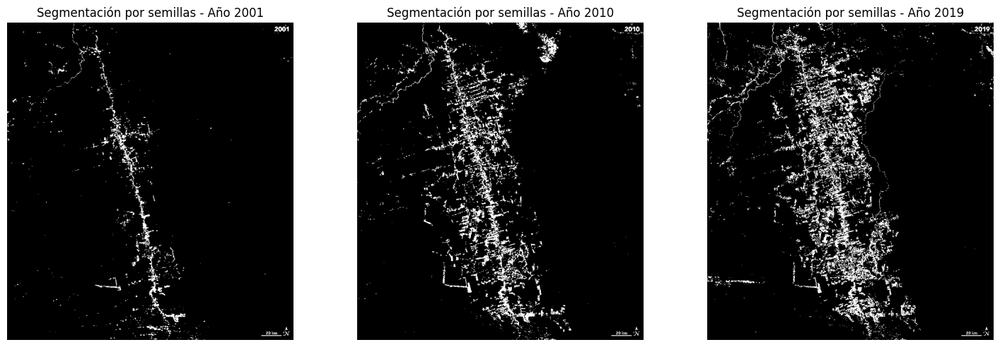

In [29]:
# Años seleccionados para mostrar
selected_years = [2001, 2010, 2019]

fig, axs = plt.subplots(1, len(selected_years), figsize=(15, 5))

for idx, year in enumerate(selected_years):
    axs[idx].imshow(segm_seed_dict[year], cmap="gray")
    axs[idx].set_title(f"Segmentación por semillas - Año {year}")
    axs[idx].axis("off")

plt.tight_layout()
plt.show()

Una vez seleccionada la técnica de **binarización por Otsu con ajuste de umbral** como método óptimo de preprocesamiento, se procedió a aplicar un algoritmo de **segmentación por crecimiento de regiones basado en semillas** sobre las 20 imágenes temporales disponibles (2000–2019). Para este proceso, se identificaron como semillas todos los píxeles blancos presentes en cada imagen binarizada, prescindiendo de cualquier tipo de muestreo aleatorio. Esta decisión metodológica garantiza una cobertura total de las regiones candidatas a deforestación, permitiendo que el crecimiento de regiones abarque con precisión las estructuras reales reflejadas en la imagen, sin pérdidas de información por submuestreo.

Inicialmente, se probó una estrategia alternativa basada en la selección aleatoria de un subconjunto de semillas, fijando un número máximo (por ejemplo, 1000) y empleando un `random_seed` para garantizar la reproducibilidad. Sin embargo, este enfoque presentaba algunas limitaciones: las regiones generadas eran discontínuas, incompletas o sesgadas, especialmente en imágenes con patrones de deforestación extensos o poco contrastados. Por esta razón, se optó por eliminar el muestreo aleatorio y aplicar el algoritmo sobre la totalidad de los píxeles blancos, a pesar del aumento significativo del coste computacional.

En este caso particular, el alto número de semillas no representa un problema crítico, dado que el volumen total de imágenes es manejable y se procesan de forma individual. No obstante, en escenarios con cientos o miles de imágenes, esta estrategia podría resultar ineficiente o inasumible computacionalmente. En tales casos, se recomienda retomar el enfoque aleatorizado, incrementando el número de semillas y ajustando su distribución para garantizar una cobertura espacial representativa, o bien explorar técnicas más avanzadas de inicialización automática de regiones.

Como se observa en los resultados, esta configuración ha permitido una segmentación precisa, estructurada y coherente entre los diferentes años. Las regiones deforestadas presentan contornos limpios, geometrías características bien preservadas y una continuidad que facilita el análisis temporal. Esta estrategia ofrece, por tanto, una base sólida para cuantificar y visualizar la evolución de la deforestación.

### 6.3 Segmentación mediante Split & Merge

El enfoque de ***Split & Merge*** combina dos fases complementarias con el objetivo de equilibrar precisión y eficiencia:

1. ***Split***: la imagen se divide de forma recursiva en regiones cada vez más pequeñas, normalmente en bloques regulares, siguiendo criterios de similitud y pertenencia. Este proceso suele representarse mediante una estructura jerárquica, como un árbol, donde cada nodo corresponde a una región de la imagen.
2. ***Merge***: una vez finalizada la fase de división, se analizan las regiones resultantes y se **fusionan aquellas que presentan propiedades similares**, eliminando divisiones innecesarias introducidas durante el *split*.

Este enfoque permite controlar el nivel de detalle de la segmentación y corregir divisiones excesivas.

Una de las principales ventajas de este método es que el proceso de división puede <strong style="color:green">paralelizarse</strong>, lo que reduce el coste computacional frente a otros algoritmos puramente iterativos. No obstante, presenta una limitación importante, ya que <strong style="color:red">una vez que las regiones han sido separadas en ramas distintas de la jerarquía, no siempre es posible fusionarlas directamente sin un postprocesado adicional</strong>. Aun así, dado que el número final de regiones suele ser reducido, este postprocesado no resulta excesivamente costoso.

Aunque el enfoque *Split and Merge* resulta conceptualmente adecuado para segmentar imágenes en regiones homogéneas mediante una estrategia jerárquica, su aplicación no se ha considerado apropiada para el problema de deforestación abordado en este trabajo. Este método parte de una división inicial en bloques regulares y sucesivas subdivisiones basadas en criterios de homogeneidad, lo que introduce una dependencia directa de la estructura geométrica inicial impuesta sobre la imagen.

En el caso de las imágenes satelitales analizadas, las áreas deforestadas no presentan una distribución regular ni alineada con una malla jerárquica, sino que aparecen como regiones irregulares, fragmentadas y de tamaño variable. Como consecuencia, la fase de *split* tiende a generar subdivisiones artificiales que no se corresponden con la estructura real del terreno, mientras que la fase de *merge* no siempre consigue recomponer regiones semánticamente coherentes sin un postprocesado adicional.

Por este motivo, **el algoritmo *Split and Merge* ha sido descartado**, al no adaptarse de forma natural a la geometría compleja y no regular de las zonas deforestadas.

### 6.4 Segmentación mediante contornos activos (*Gradient Vector Flow*)

El **crecimiento de regiones basado en *Gradient Vector Flow*** pertenece a la familia de los ***Active Contour Models***. En este enfoque, la segmentación se realiza mediante la evolución de un contorno inicial que se adapta dinámicamente a la forma del objeto presente en la imagen. Una de sus características más destacadas es que el contorno puede inicializarse lejos de los bordes reales y aun así **converger correctamente** hacia ellos.

El método se basa en la minimización de una función de energía compuesta por varios términos.

- **Energía interna** asociada a la suavidad del contorno.
- **Energía dependiente** de la intensidad de la imagen, que atrae el contorno hacia los bordes.
- Una **función adicional** que modela las propiedades exteriores del contorno, permitiendo capturar estructuras complejas y concavidades.

Matemáticamente, el modelo se formula como la minimización de una **función de energía** asociada al contorno activo:

$$
E = \int_{0}^{1} \bigl( E_{\text{int}}(v(s)) + E_{\text{imagen}}(v(s)) + E_{\text{con}}(v(s)) \bigr)\ ds
$$

donde: 

- $\boldsymbol{E_{\text{int}}}$ denota la **energía interna del contorno**. Controla su suavidad y rigidez, evitando deformaciones bruscas y garantizando que el contorno evolucione de forma regular.
- $\boldsymbol{E_{\text{imagen}}}$ representa la **energía asociada a la imagen**. Este término atrae el contorno hacia las características relevantes de la imagen, como bordes o discontinuidades de intensidad.
- $\boldsymbol{E_{\text{con}}}$​ es una **energía externa o de contorno**, que modela la influencia del entorno y permite guiar la evolución del contorno incluso en regiones complejas o con concavidades.

Debido a estas características, GVF es un algoritmo ampliamente utilizado en el **ámbito biomédico**, donde se requiere una segmentación precisa de estructuras anatómicas con formas irregulares. A cambio, el método presenta una complejidad computacional elevada y una implementación más sofisticada que los enfoques basados únicamente en vecindad.

In [30]:
# Diccionario para almacenar los resultados
snake_dict = {}

# Parámetros de contorno activo
alpha = 0.015   # Tensión: controla la elasticidad del contorno:
                    # Valores bajos permiten que la curva se estire y se adapte a formas complejas.
                    # Valores altos hacen que el contorno se contraiga y tienda a formas más cortas y simples.
beta = 10       # Rigidez: regula la suavidad del contorno penalizando cambios bruscos de curvatura.
                    # Un valor alto impone una curva más suave y regular, evitando oscilaciones y adaptaciones a ruido fino
                    # Valores bajos permiten contornos más irregulares y detallados.
gamma = 0.001   # Paso temporal: determina la velocidad de evolución del contorno en cada iteración.
                    # Valores pequeños producen una convergencia más estable y precisa, aunque más lenta.
                    # Valores grandes aceleran la evolución, pero pueden provocar inestabilidad o que el contorno no converja correctamente.

# Aplicamos a todas las imágenes binarizadas
for year, binary_img in binarized_otsu_offset_dict.items():
    # Suavizado previo para facilitar la evolución del contorno
    smoothed = gaussian(binary_img, sigma=2)

    # Definimos una forma inicial circular centrada en la imagen
    s = np.linspace(0, 2 * np.pi, 400)
    r = 400 + 100 * np.sin(s)
    c = 360 + 100 * np.cos(s)
    init = np.array([r, c]).T

    # Ejecutamos el algoritmo de contorno activo
    snake = active_contour(
        smoothed,
        init,
        alpha=alpha,
        beta=beta,
        gamma=gamma,
        max_num_iter=2500,
        convergence=0.1
    )
    
    # Guardamos el resultado
    snake_dict[year] = snake

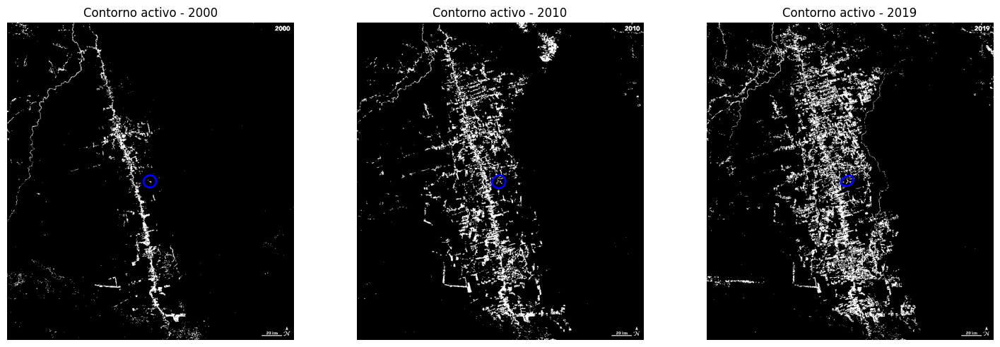

In [31]:
# Años seleccionados para mostrar
selected_years = [2000, 2010, 2019]

fig, axs = plt.subplots(1, len(selected_years), figsize=(15, 5))

for idx, year in enumerate(selected_years):
    axs[idx].imshow(binarized_otsu_offset_dict[year], cmap='gray')
    axs[idx].plot(snake_dict[year][:, 1], snake_dict[year][:, 0], '-b', lw=2, label='Snake')
    axs[idx].set_title(f'Contorno activo - {year}')
    axs[idx].axis('off')

plt.tight_layout()
plt.show()

Aunque se ha implementado el algoritmo de contorno activo (*snakes*) sobre las imágenes binarizadas suavizadas mediante filtro gaussiano, los resultados no han sido satisfactorios. La curva inicial se definió como un contorno circular centrado en la imagen, con coordenadas fijas (400, 360), sin adaptar su posición ni escala a las dimensiones reales de cada imagen. Esto ha provocado que el contorno evolucione en una región localizada que, en muchos casos, no coincide con las zonas deforestadas más representativas.

A pesar del suavizado previo, la binarización genera bordes extremadamente marcados y homogéneos, lo cual impide que el modelo identifique gradientes válidos que guíen adecuadamente la deformación del contorno. Además, el diseño del algoritmo está optimizado para adaptarse a transiciones tonales progresivas sobre imágenes en escala de grises, no sobre mapas binarios con grandes zonas planas.

Por tanto, **se concluye que el algoritmo de contorno activo no es adecuado en este contexto**, ya que no proporciona una segmentación útil ni escalable.

### 6.5 Segmentación morfológica mediante *Watershed* (cuenca hidrográfica)

El algoritmo de ***Watershed*** aborda la segmentación de imágenes en **niveles de gris** desde una interpretación geométrica. La imagen se considera como un **relieve tridimensional**, donde la intensidad de cada píxel representa una altura: los valores bajos corresponden a valles y los valores altos a crestas o montañas.

Bajo esta metáfora, cada **mínimo local** de la imagen define una **cuenca de captación (*catchment basin*)**, y el objetivo del algoritmo es dividir la imagen en regiones asociadas a estas cuencas. El proceso simula una **inundación progresiva** del relieve, comenzando desde los mínimos y aumentando gradualmente el nivel del agua.

A medida que el agua asciende, las cuencas crecen y se expanden. Cuando dos regiones en crecimiento están a punto de unirse, se construyen **diques** que impiden su fusión. Estos diques definen las llamadas **líneas de *Watershed***, que actúan como **fronteras naturales entre regiones**. El resultado final es una partición completa de la imagen en regiones conexas separadas por dichas líneas divisorias.

Desde el punto de vista de la segmentación, el **objetivo principal del algoritmo** es precisamente **alcanzar estas líneas de cresta**, que delimitan las distintas regiones de la imagen en función de su estructura topográfica. En comparación con otras técnicas, *Watershed* no busca únicamente agrupar píxeles similares, sino identificar de forma explícita las **fronteras entre regiones**.

El método permite obtener segmentaciones **muy detalladas y bien definidas**, pero presenta una limitación clásica: la <strong style="color:red">sobresegmentación</strong>. En imágenes con ruido o con numerosos mínimos locales, el algoritmo puede generar un número excesivo de regiones pequeñas. Por este motivo, *Watershed* suele combinarse con **técnicas de preprocesado**, como suavizado o filtrado, o con enfoques de **Watershed basado en marcadores**, donde se restringen los puntos de inicio de la inundación para guiar el resultado final.

El algoritmo de *Watershed* ha sido evaluado sobre distintas representaciones de la imagen, incluyendo escala de grises y canal de luminancia, con y sin preprocesado de suavizado. No obstante, los resultados obtenidos no han sido satisfactorios cuando se aplica como método principal de segmentación en este escenario.

Las imágenes satelitales de deforestación presentan numerosos mínimos locales asociados a variaciones de textura, sombras y pequeñas irregularidades del terreno, lo que provoca una **sobresegmentación significativa** al aplicar *Watershed* de forma directa. Incluso tras el filtrado previo, el algoritmo tiende a generar un número elevado de regiones pequeñas que carecen de significado semántico y dificultan la interpretación y cuantificación de resultados.

Aunque el uso de *Watershed* basado en marcadores permite mitigar parcialmente este efecto, su utilidad queda limitada a tareas de **refinamiento de fronteras** cuando existe una segmentación previa fiable. Dado que el objetivo principal del trabajo es identificar y cuantificar áreas deforestadas de forma robusta, **no se ha adoptado *Watershed* como método principal de segmentación**, reservándolo únicamente como herramienta auxiliar de postprocesado en fases exploratorias.

### 6.6 Segmentación basada en grafos: *Graph-Cuts* y agregación multiescala

En los **métodos basados en grafos**, la imagen se representa como una **red**:

- **Cada píxel es un nodo**.
- Los píxeles vecinos se conectan mediante **aristas**.
- Cada arista tiene un **peso** que mide la **similitud** entre píxeles (intensidad, color, textura, etc.).

La segmentación se obtiene **analizando el grafo y rompiendo las conexiones más débiles**, es decir, aquellas que unen píxeles poco similares. Al eliminar estas conexiones, el grafo se divide en **componentes conexas**, que corresponden a las **regiones segmentadas** de la imagen.

Este enfoque permite **integrar de forma conjunta información local y global**, combinando la relación de vecindad entre píxeles con la coherencia de regiones completas. Gracias a esta capacidad, los métodos basados en grafos ofrecen **segmentaciones robustas incluso en escenarios complejos**, aunque su implementación y el ajuste de parámetros pueden resultar más exigentes que en técnicas más simples.

Dentro de esta familia se distinguen dos tipos principales de algoritmos: ***Graph-Cuts*** y **Agregación multiescala**.

#### *Graph-Cuts*

Los métodos ***Graph-Cuts*** formulan la segmentación como un **problema de optimización global**, en el que la imagen se representa mediante un grafo y el objetivo es encontrar un **corte óptimo** que minimice una **función de coste** definida sobre dicho grafo. 

##### Funcionamiento

1. **Se parte de la imagen original**, que constituye la entrada del proceso de segmentación.
2. **Se construye un grafo** a partir de la imagen, donde cada píxel se representa como un nodo. Las conexiones entre píxeles vecinos se modelan mediante aristas a las que se asigna una **función de similaridad**, que mide el grado de parecido entre ellos. La vecindad puede ser simple, considerando únicamente píxeles próximos, o más compleja si se incluyen conexiones con píxeles más alejados.
3. **Se identifican las conectividades más débiles**, es decir, aquellas aristas que presentan una menor similaridad entre píxeles. El algoritmo realiza el **corte del grafo** a través de estos enlaces débiles, que suelen corresponder a las fronteras entre regiones distintas.
4. **El grafo resultante se transforma de nuevo en imagen**, obteniéndose una segmentación en la que las fronteras reflejan las regiones coherentes identificadas en el proceso.

#### Agregación multiescala

La **agregación multiescala** es un método de segmentación basado en grafos que construye regiones de forma **jerárquica**, partiendo del nivel de píxel y agrupando progresivamente nodos según su **similitud**. En cada iteración se generan **representantes** de las agrupaciones obtenidas, lo que permite definir nuevas escalas de la imagen y repetir el proceso hasta alcanzar una segmentación coherente.

##### Funcionamiento

1. **Se parte de la imagen original**, donde cada píxel se representa como un **nodo** del grafo.
2. **Se realiza una primera agrupación** de píxeles en función de un **criterio de similaridad**, considerando los nodos más próximos. Esta primera agregación ya constituye una segmentación, aunque suele ser **poco precisa**.
3. **De cada agrupación se obtiene un nodo representante**, normalmente calculado como el **valor medio** del grupo. Esto da lugar a una **nueva escala** o capa de la imagen, con un número menor de nodos, donde cada nodo representa a un subconjunto de píxeles originales.
4. **El proceso de agregación se repite** sobre los nodos representantes, iterando a diferentes escalas hasta que se cumple un criterio de parada, como alcanzar un número determinado de segmentos o verificar una **condición de calidad** que garantice regiones bien definidas.
5. **Finalmente, la imagen se segmenta deshaciendo las agrupaciones** realizadas en cada nivel, obteniendo la segmentación final a partir de la estructura jerárquica construida.

Se han explorado métodos de segmentación basados en grafos, incluyendo *Graph-Cuts* y técnicas de agregación multiescala, aplicados sobre distintas representaciones de la imagen (Lab, HSV y escala de grises). Sin embargo, estos enfoques no han proporcionado resultados útiles en el contexto específico de la deforestación analizada.

En el caso de *Graph-Cuts* no supervisado, la segmentación se basa exclusivamente en un término de suavidad global que favorece la agrupación de regiones espectralmente similares. En paisajes naturales con transiciones graduales, como los observados en las zonas deforestadas, esta formulación tiende a producir **particiones triviales**, donde grandes áreas quedan agrupadas en una única región, al no existir contrastes energéticamente suficientes que incentiven el corte del grafo. La ausencia de términos de datos o semillas fiables limita severamente la capacidad del algoritmo para identificar fronteras relevantes en este escenario.

Por su parte, la **agregación multiescala** construye regiones de forma jerárquica a partir de agrupaciones sucesivas basadas en criterios de similitud local. Si bien este enfoque resulta eficaz en imágenes con estructuras bien definidas y jerarquías claras, en el caso de la deforestación progresiva conduce a una fusión temprana de regiones extensas, diluyendo las fronteras entre áreas forestales y no forestales. Como resultado, las regiones obtenidas carecen de correspondencia semántica directa con el fenómeno de interés.

En consecuencia, **los métodos basados en grafos no se han incorporado al pipeline final**, al no ofrecer una segmentación estable ni interpretable para el análisis de la deforestación en imágenes satelitales, especialmente en ausencia de información supervisada explícita.

### 6.6 Comparación de resultados y selección del método óptimo

Tras aplicar y evaluar de forma sistemática un conjunto representativo de algoritmos de segmentación sobre las imágenes satelitales preprocesadas del Bosque Nacional Jamanxim (2000–2019), se concluye que **el enfoque más robusto, preciso y adaptado al fenómeno de deforestación observado ha sido la segmentación por crecimiento de regiones basada en semillas, aplicada sobre imágenes binarizadas mediante Otsu con ajuste de umbral**.

Este método combina de forma efectiva una binarización adaptativa sensible a los patrones tonales del terreno, con una expansión controlada desde todos los píxeles blancos como puntos semilla. Esta estrategia garantiza una cobertura espacial completa, una segmentación continua y estructuralmente coherente, y una excelente estabilidad temporal en las 20 imágenes procesadas. A pesar del mayor coste computacional asociado al uso exhaustivo de semillas, su aplicación ha resultado viable en este caso, al tratarse de una serie de tamaño moderado, y ha ofrecido una base sólida para el análisis longitudinal del cambio en cobertura forestal.

Frente a este enfoque, el resto de métodos explorados han mostrado limitaciones relevantes. **Split and Merge** ha sido descartado por su falta de adecuación geométrica al patrón irregular de las zonas deforestadas. **Contornos activos (*snakes*)**, aunque teóricamente apropiado para detectar bordes suaves, ha resultado ineficaz sobre los mapas binarizados con regiones planas y ha demostrado una alta sensibilidad a la inicialización. **Watershed**, aplicado sobre distintas variantes de la imagen (gris, canal L, HSV), ha producido una sobresegmentación excesiva que dificulta la interpretación. Finalmente, los algoritmos **basados en grafos**, incluyendo *Graph-Cuts* y agregación jerárquica, han ofrecido resultados visualmente pobres, con regiones fusionadas que no delimitan adecuadamente las zonas de interés, debido a la falta de términos de energía discriminativos en este tipo de paisaje.

En consecuencia, **se adopta como técnica principal de segmentación la combinación de binarización Otsu con offset + crecimiento de regiones basado en semillas completas**, por su equilibrio entre precisión espacial, robustez temporal y fidelidad estructural.

### 6.7 Implementación de la función de segmentación por crecimiento de regiones basada en semillas

Se define esta función con el objetivo de **consolidar espacialmente las máscaras binarias obtenidas tras la binarización del canal *L* corregido**, aplicando de forma sistemática el algoritmo de crecimiento de regiones basado en semillas.

La encapsulación del método en una función independiente permite evitar duplicación de código, asegurar la reproducibilidad del proceso y facilitar su integración directa en el *pipeline* final de estimación de deforestación.

In [32]:
def apply_seed_region_growing(binary_dict):
    """
    Aplica segmentación por crecimiento de regiones basada en semillas
    sobre imágenes binarias.

    Parámetros:
        binary_dict (dict): Diccionario con imágenes binarias (0/1).

    Devuelve:
        segm_seed_dict (dict): Diccionario con máscaras segmentadas finales.
    """

    # Diccionario para almacenar los resultados
    segm_seed_dict = {}

    # Recorremos las imágenes binarizadas
    for year, binary_img in binary_dict.items():
        # Identificamos todos los píxeles blancos como semillas
        seed_points = np.argwhere(binary_img == 1)

        # Máscara acumulada de regiones
        mask = np.zeros_like(binary_img, dtype=bool)

        # Crecimiento desde cada semilla (sin tolerancia: imagen binaria)
        for seed in seed_points:
            mask |= flood(binary_img, tuple(seed))

        # Guardamos el resultado final
        segm_seed_dict[year] = mask.astype(np.uint8)

    return segm_seed_dict

## 7. Cálculo del área deforestada por año

Una vez evaluados los métodos de segmentación y seleccionado el enfoque más fiable, este apartado desarrolla el procedimiento definitivo para cuantificar la superficie deforestada en cada año de la serie temporal. El cálculo se basa en un flujo de procesamiento secuencial que integra la detección de nubes a partir del canal *b* del espacio Lab, la interpolación espacial de las regiones afectadas, la binarización del canal *L* corregido y la segmentación mediante crecimiento de regiones desde semillas fiables. A partir de estas máscaras segmentadas, se calcula el área deforestada neta en kilómetros cuadrados, permitiendo analizar de forma cuantitativa la evolución del fenómeno en la región de estudio durante dos décadas.

#### 7.1 Generación de máscaras de nubes a partir del canal *b* (Lab)

Tal y como se ha comentado en apartados anteriores, el canal **b** del espacio de color **Lab** presenta un comportamiento especialmente útil en las imágenes satelitales analizadas. Concretamente, se ha observado que **las nubes y las marcas gráficas superpuestas** (como el número de año o la marca de agua) se manifiestan sistemáticamente como **zonas muy oscuras** dentro de este canal. Esta propiedad permite emplear el canal *b* como referencia directa para construir una **máscara binaria de exclusión**, cuyo objetivo es identificar regiones cuya información radiométrica no es válida para el cálculo del área deforestada.

En este contexto, se adopta un enfoque directo y eficiente, centrado exclusivamente en la generación de una **máscara binaria a partir del canal *b***. Se considera como región no válida todo aquel píxel que presente un valor muy bajo en dicho canal, lo que corresponde de forma consistente con la presencia de nubes o marcas sobresaturadas. Esta máscara resultante será utilizada como **filtro posterior** en el proceso de estimación de área, sin intervenir en la segmentación ni en los algoritmos de crecimiento de regiones.

Aunque las esquinas de la imagen contienen elementos gráficos fijos, como el año en la esquina superior derecha o la marca de agua en la inferior, se ha comprobado que estas **regiones son constantes a lo largo de la serie temporal** y su presencia no varía entre imágenes. Por tanto, **no se aplican operaciones adicionales para su eliminación explícita**, ya que su efecto sobre el cálculo de deforestación resulta **negligible y sistemático**, permitiendo ser despreciado sin comprometer la validez de los resultados.

Esta estrategia, sencilla pero robusta, garantiza que las **zonas contaminadas por nubes** no introduzcan sesgos en el cálculo final, y abre la posibilidad de aplicar técnicas de **interpolación espacial y temporal** para estimar la cobertura en aquellas regiones donde la visibilidad esté comprometida. En consecuencia, esta aproximación mejora la fiabilidad y la continuidad del análisis sin alterar la estructura general del pipeline de segmentación.

In [33]:
# Aplicamos el pipeline de mejora al conjunto de imágenes originales RGB
lab_enhanced_dict = enhance_luminance_pipeline(frames_dict)

# Diccionario para almacenar las máscaras binarias (nubes y marcas)
cloud_mask_dict = {}

# Umbral para identificar píxeles oscuros en el canal b (ajustable)
threshold_b = 10

# Generamos las máscaras recorriendo todas las imágenes Lab
for year, lab_img in lab_enhanced_dict.items():
    # Extraemos el canal b
    b_channel = lab_img[:, :, 2]
    
    # Creamos la máscara binaria: 1 si b < umbral (zona oscura), 0 en caso contrario
    mask = (b_channel < threshold_b)
    
    # Almacenamos la máscara
    cloud_mask_dict[year] = mask

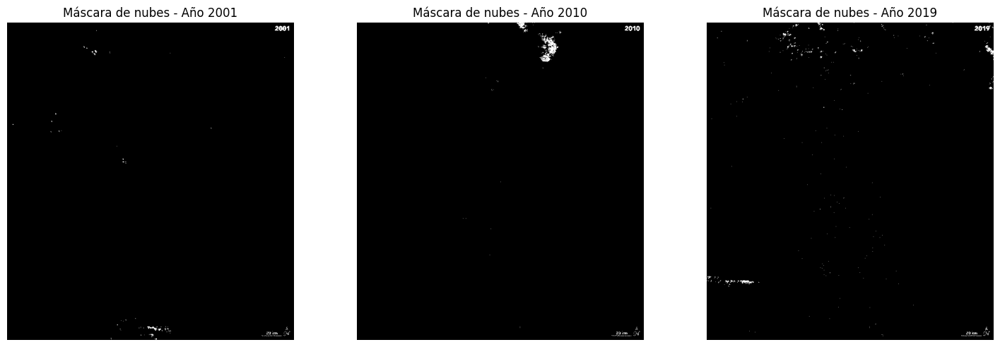

In [34]:
# Años seleccionados para mostrar
selected_years = [2001, 2010, 2019]

fig, axs = plt.subplots(1, len(selected_years), figsize=(15, 5))

for idx, year in enumerate(selected_years):
    axs[idx].imshow(cloud_mask_dict[year], cmap='gray')
    axs[idx].set_title(f"Máscara de nubes - Año {year}")
    axs[idx].axis("off")

plt.tight_layout()
plt.show()

Los resultados obtenidos tras aplicar un umbral de intensidad de `threshold_b = 10` sobre el canal **b** del espacio *Lab* permiten generar máscaras binarias en las que se identifican de forma efectiva las **zonas contaminadas por nubes y marcas gráficas sobresaturadas**. Tal y como se observa en las imágenes seleccionadas de los años 2001, 2010 y 2019, el umbral elegido proporciona una segmentación limpia y precisa, donde las nubes aparecen claramente delimitadas como áreas blancas sobre un fondo negro.

En todas las imágenes, las **anotaciones fijas como el número del año (esquina superior derecha) y la marca de agua institucional (esquina inferior derecha)** también quedan marcadas como regiones blancas. No obstante, tal y como se ha justificado en el apartado metodológico, estas zonas no requieren corrección explícita, ya que su ubicación es constante y no afectan al análisis temporal de la deforestación.

La elección de un umbral bajo garantiza la **detección exhaustiva de píxeles negros** en el canal *b*, que corresponde a las regiones sobresaturadas con menor fiabilidad radiométrica. Esto permite generar una **máscara robusta y homogénea**, adecuada para su uso posterior como filtro de exclusión o como base para estrategias de interpolación en el cálculo del área deforestada.

La aplicación del umbral `b < 10` ha demostrado ser una **estrategia eficaz para la identificación automática de nubes**, proporcionando máscaras que capturan de forma precisa las regiones no válidas sin afectar al resto del contenido de la imagen.

#### 7.2 Interpolación de zonas afectadas por nubes

Una vez generadas las máscaras binarias que identifican las regiones contaminadas por nubes a partir del canal **b** del espacio *Lab*, el siguiente paso consiste en **restaurar la información radiométrica de los píxeles afectados**, con el objetivo de preservar la continuidad espacial y temporal de la serie de imágenes antes del cálculo del área deforestada.

Para ello, se adopta una estrategia de **interpolación temporal por píxel**, basada en la imputación de los valores ausentes mediante información proveniente de los años adyacentes. El procedimiento se define de la siguiente manera:

* Para los años **intermedios** (por ejemplo, 2001–2018), cada píxel enmascarado se rellena con el **valor medio entre el año anterior y el siguiente**, calculado posición a posición. Esta aproximación permite capturar posibles tendencias o transiciones suaves en el tiempo, minimizando artefactos o saltos abruptos en la señal.
* En el caso de los **extremos de la serie** (año inicial y final: 2000 y 2019), donde no es posible disponer de ambas referencias temporales, se utiliza el valor del **año vecino más cercano** como estimación directa.

Este enfoque garantiza una restauración localizada y coherente con la dinámica temporal de cada región, evitando suposiciones globales o reemplazos arbitrarios. Además, permite preservar las características texturales y tonales de las zonas adyacentes, respetando las estructuras espaciales originales sin introducir distorsiones relevantes.

La interpolación se aplica **exclusivamente sobre los píxeles marcados como contaminados por la máscara binaria**, manteniendo intacta la información original del resto de la imagen. De este modo, se garantiza que la estimación final del área deforestada no se vea alterada por artefactos atmosféricos o elementos superpuestos, mejorando así la precisión del análisis.

In [35]:
# Creamos un nuevo diccionario para almacenar las imágenes Lab corregidas (L mejorado + interpolado donde hay nubes)
lab_interp_enhanced_dict = {}

years = sorted(lab_enhanced_dict.keys())

for i, year in enumerate(years):
    cloud_mask = cloud_mask_dict[year].astype(bool)

    L_curr = lab_enhanced_dict[year][:, :, 0].astype(np.float32)
    lab_interp = lab_enhanced_dict[year].copy()

    if i == 0:
        L_next = lab_enhanced_dict[years[i + 1]][:, :, 0].astype(np.float32)
        L_interp = np.where(cloud_mask, L_next, L_curr)
    elif i == len(years) - 1:
        L_prev = lab_enhanced_dict[years[i - 1]][:, :, 0].astype(np.float32)
        L_interp = np.where(cloud_mask, L_prev, L_curr)
    else:
        L_prev = lab_enhanced_dict[years[i - 1]][:, :, 0].astype(np.float32)
        L_next = lab_enhanced_dict[years[i + 1]][:, :, 0].astype(np.float32)
        L_interp = np.where(cloud_mask, (L_prev + L_next) / 2, L_curr)

    lab_interp[:, :, 0] = L_interp
    lab_interp_enhanced_dict[year] = lab_interp

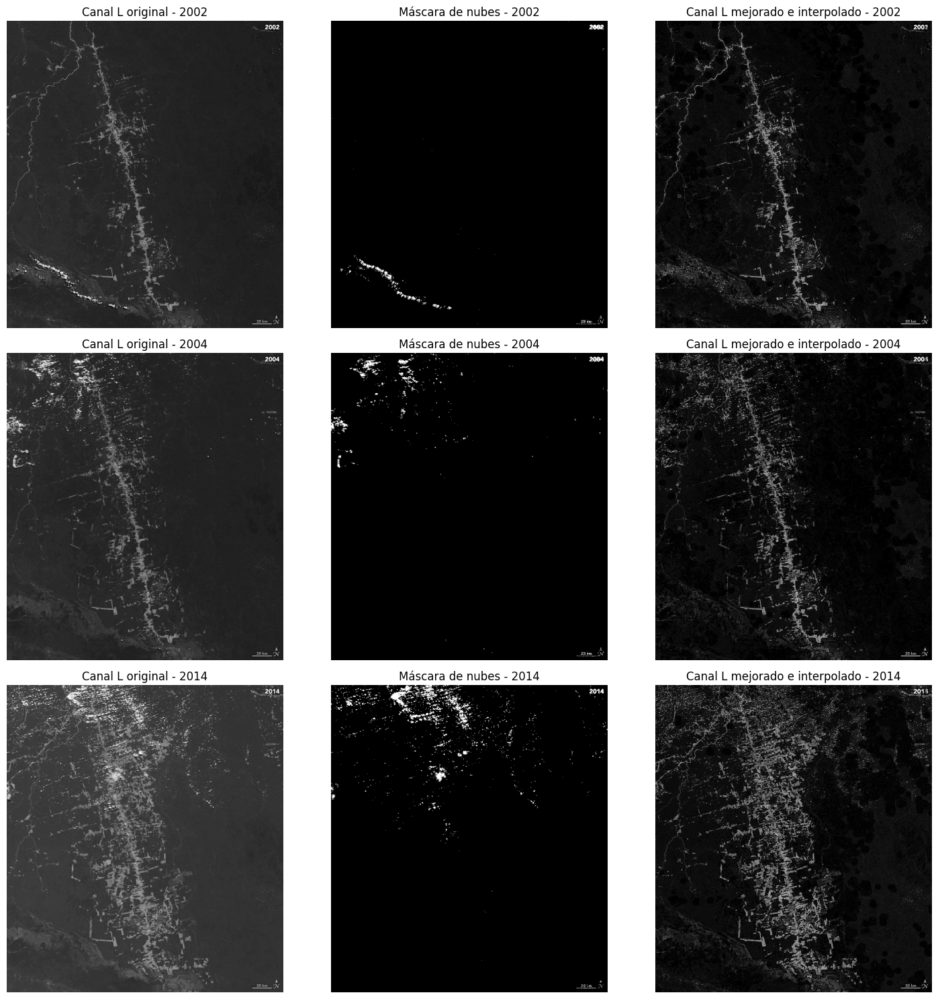

In [36]:
# Años seleccionados para mostrar
selected_years = [2002, 2004, 2014]

# Visualización
fig, axs = plt.subplots(len(selected_years), 3, figsize=(15, 15))

for i, year in enumerate(selected_years):
    # Canal L original
    L_original = lab_frames_dict[year][:, :, 0]
    # Máscara de nubes
    cloud_mask = cloud_mask_dict[year]
    # Canal L interpolado
    L_interpolated = lab_interp_enhanced_dict[year][:, :, 0]

    axs[i, 0].imshow(L_original, cmap='gray')
    axs[i, 0].set_title(f"Canal L original - {year}")

    axs[i, 1].imshow(cloud_mask, cmap='gray')
    axs[i, 1].set_title(f"Máscara de nubes - {year}")

    axs[i, 2].imshow(L_interpolated, cmap='gray')
    axs[i, 2].set_title(f"Canal L mejorado e interpolado - {year}")

    for j in range(3):
        axs[i, j].axis('off')

plt.tight_layout()
plt.show()


Los resultados obtenidos tras aplicar la interpolación temporal del canal *L* en los píxeles afectados por nubes pueden considerarse altamente satisfactorios y confirman la validez de la estrategia planteada.

Como se aprecia en la figura, las zonas originalmente cubiertas por nubes (identificadas en blanco en la columna central) presentan una pérdida de información notable en las imágenes originales del canal *L* (columna izquierda). Estas regiones aparecen como áreas saturadas, sin gradaciones tonales, lo que comprometería gravemente el análisis de deforestación si no se corrigieran.

Tras aplicar la interpolación, las imágenes resultantes (columna derecha) muestran una reconstrucción tonal coherente con las zonas circundantes, sin artefactos visibles ni transiciones abruptas. La continuidad espacial se preserva, y las regiones previamente opacas se integran de forma natural en la escena, manteniendo los patrones geométricos de deforestación.

Este comportamiento se repite en los tres años evaluados (2002, 2004 y 2014), lo que indica que el método es robusto ante variaciones interanuales en cobertura nubosa o estructura del paisaje. Además, al realizar la estimación exclusivamente en los píxeles marcados como no válidos y conservar intacto el resto de la imagen, se garantiza que la interpolación no introduce alteraciones innecesarias.

Por tanto, puede concluirse que la estrategia de corrección mediante interpolación temporal constituye un mecanismo eficaz y profesional para mitigar el impacto de las nubes en el análisis del canal *L*, mejorando la calidad de las imágenes sin comprometer su validez radiométrica o estructural.

#### 7.3 Binarización del canal L corregido para identificación de zonas deforestadas

In [37]:
# Extraemos canal L mejorado e interpolado
l_corrected_dict = {
    year: lab_img[:, :, 0]
    for year, lab_img in lab_interp_enhanced_dict.items()
}

# Binarizamos con Otsu + desplazamiento
binarized_otsu_offset_dict = apply_otsu_with_offset(l_corrected_dict)

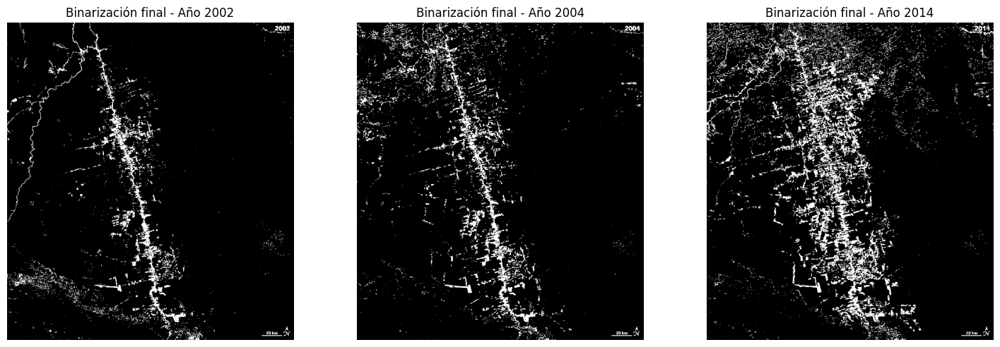

In [38]:
# Años seleccionados para mostrar
selected_years = [2002, 2004, 2014]

fig, axs = plt.subplots(1, len(selected_years), figsize=(15, 5))

for idx, year in enumerate(selected_years):
    axs[idx].imshow(binarized_otsu_offset_dict[year], cmap='gray')
    axs[idx].set_title(f"Binarización final - Año {year}")
    axs[idx].axis("off")

plt.tight_layout()
plt.show()

#### 7.4 Aplicación final del crecimiento de regiones sobre las máscaras binarizadas

In [39]:
# Aplicación del crecimiento de regiones sobre las máscaras binarias corregidas
segm_seed_dict = apply_seed_region_growing(binarized_otsu_offset_dict)

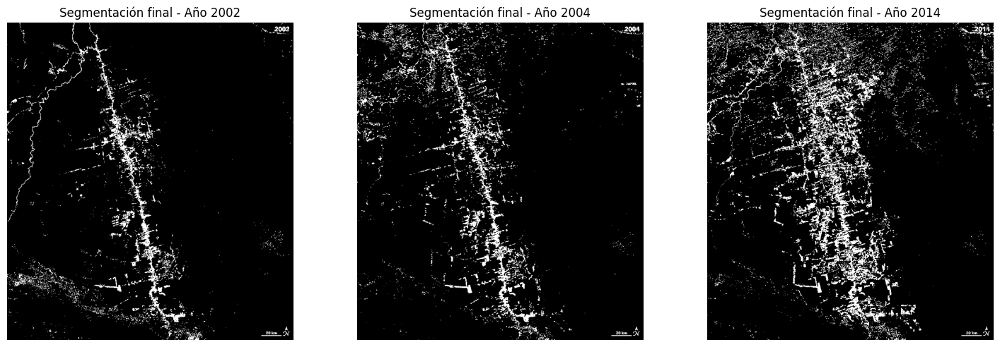

In [40]:
# Años seleccionados para mostrar
selected_years = [2002, 2004, 2014]

fig, axs = plt.subplots(1, len(selected_years), figsize=(15, 5))

for idx, year in enumerate(selected_years):
    axs[idx].imshow(segm_seed_dict[year], cmap='gray')
    axs[idx].set_title(f"Segmentación final - Año {year}")
    axs[idx].axis("off")

plt.tight_layout()
plt.show()

#### 7.5 Cálculo del área deforestada neta

In [41]:
# Diccionario para almacenar el área deforestada por año
deforestation_area_km2 = {}

# Recorremos cada imagen segmentada
for year, mask in segm_seed_dict.items():
    # Contamos píxeles blancos (valor 1 = deforestado)
    deforested_pixels = np.sum(mask == 1)
    
    # Calculamos el área total en km²
    area_km2 = deforested_pixels * pixel_area_km2
    
    # Guardamos el resultado
    deforestation_area_km2[year] = area_km2

In [42]:
# Convertimos el diccionario a DataFrame
area_df = pd.DataFrame.from_dict(
    deforestation_area_km2,
    orient='index',
    columns=['Área deforestada (km²)']
)

# El índice pasa a ser una columna
area_df.index.name = 'Año'
area_df.reset_index(inplace=True)

# Ordenamos por año
area_df.sort_values('Año', inplace=True)

# Mostramos la tabla
display(area_df.style.hide(axis='index'))

Año,Área deforestada (km²)
2000,2896.885813
2001,2693.886967
2002,3618.300654
2003,3353.787005
2004,4870.280661
2005,4881.199539
2006,5532.179931
2007,6069.665513
2008,6545.482507
2009,6881.199539


## 8. Análisis temporal y visualización de resultados

Este apartado presenta una evaluación cuantitativa y visual de la evolución de la deforestación a lo largo del periodo 2000–2019. A partir de las máscaras binarizadas obtenidas tras la segmentación por crecimiento desde semillas, se calcula el área deforestada anual, expresada en kilómetros cuadrados. La superficie total de cada imagen ha sido estimada mediante la resolución espacial conocida (20 km ↔ 51 píxeles), lo que permite transformar el conteo de píxeles blancos en medidas reales del terreno.

Se han generado diversas representaciones gráficas para facilitar la interpretación de tendencias a lo largo del tiempo, identificar patrones de variabilidad interanual y comparar el estado de la cobertura entre el primer y último año disponible. Estas visualizaciones permiten una lectura complementaria del fenómeno, cuantificando no solo la evolución absoluta, sino también las fluctuaciones relativas y acumuladas del proceso de deforestación.

### 8.1 Evolución anual del área deforestada

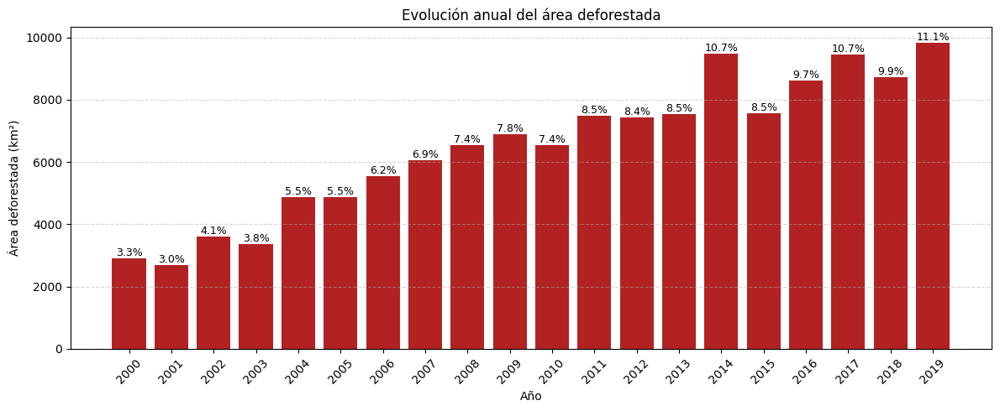

In [43]:
# Aseguramos orden por año
area_df_sorted = area_df.sort_values('Año')

# Años para el eje X
years = area_df_sorted['Año'].astype(int)

# Variable de interés: área deforestada
area = area_df_sorted['Área deforestada (km²)']

# Porcentaje deforestado real sobre el total visible
percentage = (area / total_area_km2) * 100

# Área total del territorio por imagen (fija para todos los años)
img_shape = next(iter(segm_seed_dict.values())).shape
total_pixels = img_shape[0] * img_shape[1]
total_area_km2 = total_pixels * pixel_area_km2

plt.figure(figsize=(12, 5))
plt.bar(years, area, color='firebrick')
plt.xlabel('Año')
plt.ylabel('Área deforestada (km²)')
plt.title('Evolución anual del área deforestada')

plt.xticks(years, rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.5)

# Etiquetas: porcentaje real de deforestación por año
for x, y, p in zip(years, area, percentage):
    plt.text(
        x,
        y,
        f'{p:.1f}%',
        ha='center',
        va='bottom',
        fontsize=9
    )

plt.tight_layout()
plt.show()

El gráfico de barras representa la **evolución anual del área deforestada** en el área de estudio entre los años 2000 y 2019. Las barras muestran la superficie deforestada cada año en kilómetros cuadrados, mientras que las etiquetas sobre cada barra indican el **porcentaje que representa dicha superficie respecto al total visible** en cada imagen satelital (aproximadamente 89.000 km²).

Desde una perspectiva cuantitativa y temporal, se observa una **tendencia creciente en la deforestación**, que pasa de valores iniciales en torno al **3–4 %** del territorio en los años 2000–2003 (con mínimos absolutos en 2001 con 2.693 km² y 3.0 %) a superar el **10 % en los años 2014, 2017 y 2019**. El máximo se alcanza en **2019**, con **9.838 km² deforestados**, lo que representa **el 11.1 % de la superficie total visible**.

Se identifican dos etapas claramente diferenciadas:

- **2000–2005**: crecimiento moderado con altibajos, manteniéndose por debajo del 6 % anual. La deforestación ronda entre **2.700 y 4.800 km²**.
- **2006–2013**: fase de incremento progresivo hasta estabilizarse entre el 7–8.5 %, con valores anuales superiores a **5.500 km²**, lo que indica un deterioro sostenido.
- **2014–2019**: consolidación del proceso de pérdida forestal con valores críticos, donde en varios años consecutivos se supera la barrera del **9 %**, indicando un ritmo de deforestación muy elevado y persistente.

### 8.2 Variación porcentual interanual

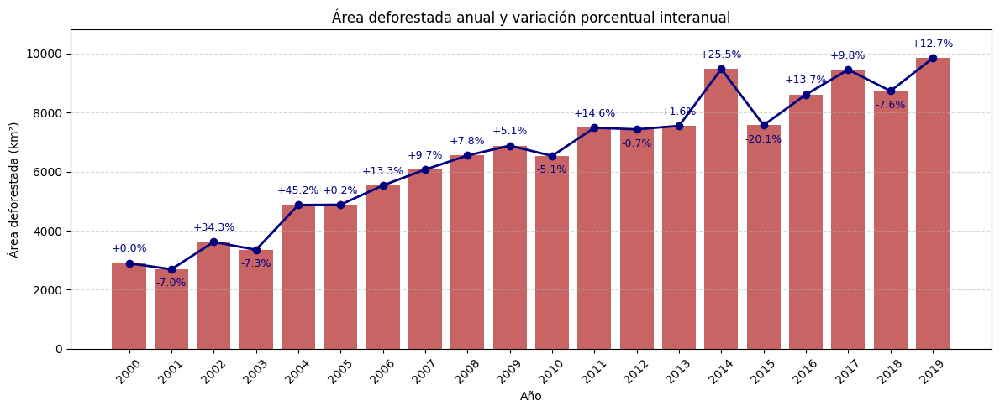

In [44]:
# Variación porcentual interanual
percent_change = area.pct_change() * 100
percent_change.iloc[0] = 0.0  # Primer año sin referencia previa

plt.figure(figsize=(12, 5))

# Barras
plt.bar(years, area, color='firebrick', alpha=0.7)

# Línea uniendo las puntas de las barras
plt.plot(years, area, color='navy', marker='o', linewidth=2)

# Desplazamiento vertical fijo (en unidades del eje Y)
offset = area.max() * 0.03

# Etiquetas de porcentaje siempre encima del punto
for x, y, p in zip(years, area, percent_change):
    y_text = y + offset if p >= 0 else y - offset  # Ajuste vertical para evitar superposición con las barras
    plt.text(
        x,
        y_text,
        f'{p:+.1f}%',
        ha='center',
        va='bottom' if p >= 0 else 'top',
        fontsize=9,
        color='navy'
    )

plt.xlabel('Año')
plt.ylabel('Área deforestada (km²)')
plt.title('Área deforestada anual y variación porcentual interanual')

# Margen superior para evitar que los textos choquen con el borde
plt.ylim(top=area.max() * 1.10)


plt.xticks(years, rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

Este gráfico combina de forma efectiva dos perspectivas complementarias: la **superficie deforestada anual en km²** (barras rojas) y la **variación porcentual interanual** (línea azul con marcadores y etiquetas). Esta representación dual permite analizar no solo la magnitud absoluta de la deforestación, sino también su comportamiento dinámico a lo largo del tiempo.

Desde el punto de vista cuantitativo, se observan varios periodos clave:

- **Crecimientos abruptos**: destacan incrementos como el de **2004 (+45.2 %)**, **2011 (+14.6 %)**, **2014 (+25.5 %)** y **2019 (+12.7 %)**, indicando años con un fuerte avance del proceso de pérdida de cobertura vegetal. Estas subidas están asociadas a picos evidentes en las barras, superando los **7.500 km²** en cada caso.
- **Descensos puntuales**: los años **2001 (−7.0 %)**, **2003 (−7.3 %)**, **2010 (−5.1 %)**, **2015 (−20.1 %)** y **2018 (−7.6 %)** muestran retrocesos en la deforestación anual. No obstante, estos descensos no logran revertir la tendencia general, sino que constituyen pausas o ralentizaciones temporales.
- **Tendencia de fondo**: a pesar de las oscilaciones, se constata una **acumulación sostenida**, con valores que pasan de **menos de 3.000 km² en 2000** a casi **10.000 km² en 2019**, lo que implica una multiplicación por más de tres veces en dos décadas.

### 8.3 Variación absoluta interanual

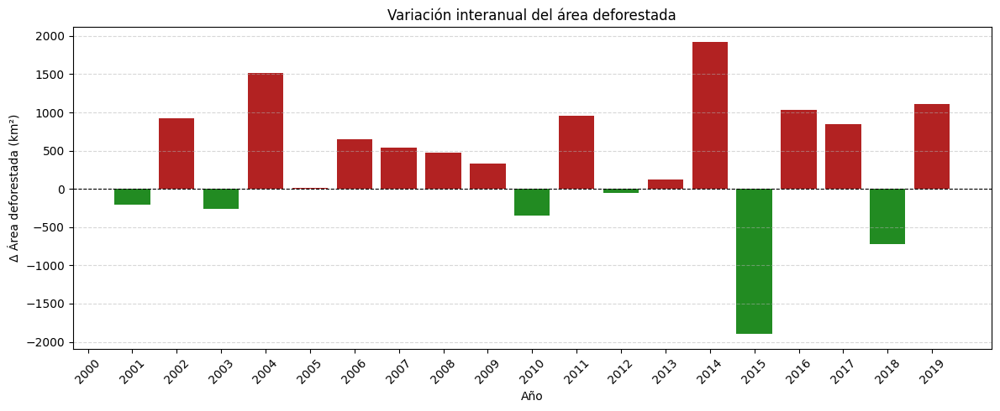

In [45]:
# 4. Gráfico de variación interanual
delta_area = area.diff()

colors = ['firebrick' if v > 0 else 'forestgreen' for v in delta_area]

plt.figure(figsize=(12, 5))
plt.bar(years, delta_area, color=colors)
plt.axhline(0, linestyle='--', color='black', linewidth=0.8)

plt.xlabel('Año')
plt.ylabel('Δ Área deforestada (km²)')
plt.title('Variación interanual del área deforestada')

plt.xticks(years, rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

El gráfico representa de forma clara y concisa la **variación absoluta interanual del área deforestada**, expresada en kilómetros cuadrados, utilizando barras verticales codificadas por color: **rojo** para incrementos y **verde** para reducciones.

Este tipo de representación permite identificar de un vistazo los años en los que la deforestación se **aceleró**, se **contuvo** o **retrocedió** respecto al año anterior:

- **Incrementos destacados**: los años con mayor aumento absoluto en área deforestada son **2014 (+1936 km²)**, **2004 (+1516 km²)** y **2016 (+1027 km²)**. Estos picos reflejan momentos críticos de expansión de la deforestación, posiblemente asociados a presiones socioeconómicas, cambios en políticas ambientales o intensificación de actividades extractivas.
- **Reducciones abruptas**: **2015 (−1953 km²)** constituye el descenso más significativo de toda la serie, seguido por **2018 (−755 km²)** y **2010 (−372 km²)**. Estas caídas pueden sugerir políticas de contención, condiciones climáticas específicas o simples fluctuaciones no sostenidas.
- **Oscilaciones irregulares**: el gráfico muestra una **dinámica no lineal**, con sucesivos picos positivos y negativos, lo que evidencia la **volatilidad del fenómeno** y la dificultad de mantener reducciones sostenidas en el tiempo.

### 8.4 Comparativa acumulada (2000 vs 2019)

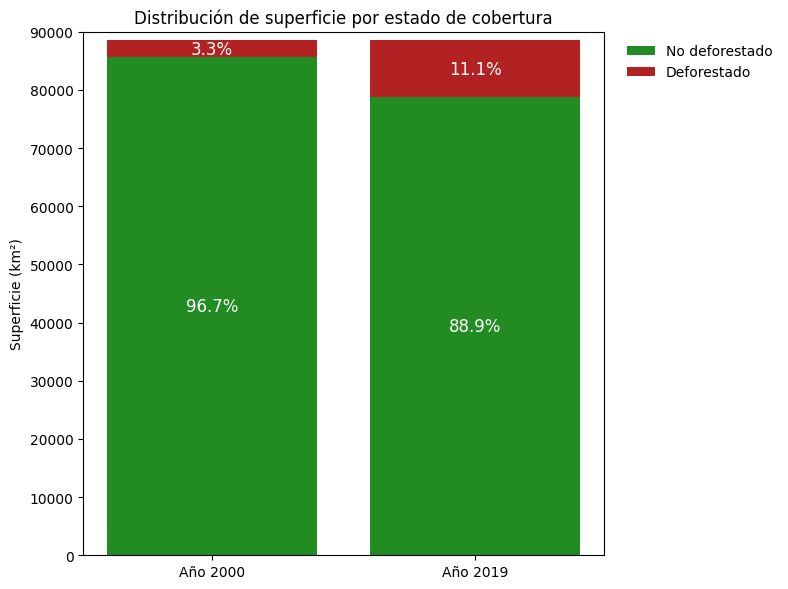

In [46]:
# Seleccionamos primer y último año
years_selected = [
    area_df['Año'].min(),
    area_df['Año'].max()
]

labels = []
deforested_area = []
non_deforested_area = []

for year in years_selected:
    area_def = area_df.loc[area_df['Año'] == year,
                           'Área deforestada (km²)'].values[0]

    deforested_area.append(area_def)
    non_deforested_area.append(total_area_km2 - area_def)

    labels.append(f'Año {year}')

deforested_area = np.array(deforested_area)
non_deforested_area = np.array(non_deforested_area)
total_area = deforested_area + non_deforested_area  # = total_area_km2

# Porcentajes
def_pct = deforested_area / total_area * 100
non_def_pct = non_deforested_area / total_area * 100

# Gráfico de barras apiladas
plt.figure(figsize=(8, 6))

plt.bar(labels, non_deforested_area,
        color='forestgreen', label='No deforestado')

plt.bar(labels, deforested_area,
        bottom=non_deforested_area,
        color='firebrick', label='Deforestado')

plt.ylabel('Superficie (km²)')
plt.title('Distribución de superficie por estado de cobertura')

# Escala explícita del eje Y (0 a 90000, saltos de 10000)
plt.ylim(0, 90000)
plt.yticks(np.arange(0, 90001, 10000))

# Etiquetas de porcentaje
for i in range(len(labels)):
    plt.text(
        i,
        non_deforested_area[i] / 2,
        f'{non_def_pct[i]:.1f}%',
        ha='center', va='center', color='white', fontsize=12
    )

    plt.text(
        i,
        non_deforested_area[i] + deforested_area[i] / 2,
        f'{def_pct[i]:.1f}%',
        ha='center', va='center', color='white', fontsize=12
    )

# Leyenda fuera del gráfico (derecha, centrada en altura del gráfico)
plt.legend(
    loc='upper left',
    bbox_to_anchor=(1.02, 1.0),
    frameon=False
)

plt.tight_layout()
plt.show()

Este gráfico de barras apiladas muestra la **distribución comparativa de la cobertura terrestre entre los años 2000 y 2019**, diferenciando las superficies **deforestadas** (en rojo) y **no deforestadas** (en verde), expresadas en kilómetros cuadrados y acompañadas de su respectivo porcentaje sobre el total.

Los resultados reflejan un **aumento notable del área deforestada** a lo largo del periodo analizado:

- En el **año 2000**, apenas un **3.3% del territorio** analizado se encontraba deforestado (aprox. **2897 km²**), mientras que el **96.7%** permanecía cubierto por vegetación.
- Para **2019**, la superficie deforestada alcanza el **11.1%** del total (**9838 km²**), lo que implica una pérdida acumulada de aproximadamente **6941 km²**, equivalente a una reducción relativa del **8%** sobre la cobertura forestal original.

### 8.5 Conclusiones del análisis temporal

Los resultados muestran una **tendencia general al alza en la deforestación** entre 2000 y 2019, con un incremento acumulado de más de **6900 km²**. La evolución no ha sido lineal: se identifican **fluctuaciones interanuales** con picos abruptos en determinados años, posiblemente asociados a factores económicos, normativos o climáticos. El año 2014 destaca como el de mayor superficie deforestada (9474 km²), mientras que en 2001 y 2003 se registraron retrocesos temporales.

En términos relativos, la proporción de terreno deforestado **se ha triplicado** respecto a la situación del año 2000, pasando del 3.3% al 11.1%. Este avance progresivo, cuantificado y visualizado a lo largo de dos décadas, constituye una señal clara de transformación del paisaje, y pone en evidencia la necesidad de estrategias eficaces de monitoreo y conservación ambiental.

## 9. Conclusiones

Los resultados obtenidos en esta actividad demuestran que es posible llevar a cabo un análisis multitemporal riguroso de la deforestación utilizando técnicas clásicas de procesamiento de imágenes, siempre que se implemente una estrategia de mejora y segmentación adaptada a las limitaciones propias del dominio satelital. En este caso, la presencia sistemática de nubes, la variabilidad radiométrica interanual y el bajo contraste estructural en determinadas zonas han sido compensados mediante un *pipeline* secuencial cuidadosamente diseñado que combina interpolación espacial, mejora tonal selectiva y segmentación binaria robusta.

En primer lugar, se aplicó un proceso de **mejora del canal de luminancia (*L*) del espacio *Lab*** mediante una combinación de técnicas de realce local y estructural, incluyendo CLAHE, filtrado morfológico *Top-Hat* y *Unsharp Masking*. Este tratamiento permitió normalizar los niveles de iluminación entre imágenes, incrementar el contraste local y recuperar detalles relevantes en zonas afectadas por sombras, variaciones atmosféricas o degradación radiométrica, garantizando una **coherencia tonal multitemporal** imprescindible para un análisis comparativo fiable.

A continuación, se explotó de forma específica el **canal *b* del espacio *Lab*** para la identificación de regiones no válidas asociadas principalmente a **nubes y elementos gráficos superpuestos**. La detección de píxeles oscuros en este canal permitió construir una máscara robusta de exclusión, sobre la cual se aplicó una **estrategia de interpolación temporal** basada en la información de los años adyacentes. Este procedimiento permitió imputar valores coherentes en las zonas contaminadas sin necesidad de eliminar imágenes completas, preservando así la continuidad espacial y temporal de la serie.

Una vez corregidas las imágenes a nivel radiométrico, se procedió a la **binarización mediante un umbral de Otsu con desplazamiento controlado**, lo que proporcionó un equilibrio adecuado entre sensibilidad y especificidad en la detección de áreas deforestadas. 

Finalmente, la segmentación se consolidó mediante un **crecimiento completo desde semillas**, utilizando todos los píxeles blancos como puntos iniciales. Este enfoque permitió expandir de forma homogénea las regiones deforestadas, eliminar fragmentaciones residuales y evitar la aparición de falsas detecciones aisladas, dando lugar a máscaras finales estables y espacialmente coherentes para el cálculo del área deforestada.

Desde el punto de vista cuantitativo, el análisis temporal ha permitido identificar un patrón claro de avance progresivo de la deforestación entre 2000 y 2019. La superficie deforestada ha pasado de **2896.89 km² en 2000 a 9838.06 km² en 2019**, lo que representa un incremento acumulado de más de **6900 km²**. A nivel relativo, la proporción del área afectada se ha triplicado, pasando del 3.3% al 11.1% del total visible. Este proceso ha sido irregular: años como 2004 y 2014 destacan por aumentos abruptos (+45.2% y +25.5%, respectivamente), mientras que en 2015 se observa una reducción significativa (–20.1%), posiblemente asociada a políticas puntuales de conservación o condiciones climáticas atípicas.

Estos resultados validan la hipótesis de que un flujo de procesamiento estructurado y reproducible puede proporcionar estimaciones precisas y consistentes de la evolución de la cobertura forestal a lo largo del tiempo. El sistema desarrollado permite detectar tendencias, comparar años clave y visualizar el impacto acumulado de la deforestación con alto nivel de detalle tanto espacial como temporal.

Desde un punto de vista práctico, este enfoque destaca por su **elevada transparencia metodológica y capacidad para operar sobre datos reales sin necesidad de aprendizaje supervisado ni anotaciones manuales**. Estas cualidades lo hacen especialmente adecuado para tareas de monitoreo ambiental en contextos donde se requiere escalabilidad, interpretabilidad y robustez operativa.